In [1]:
# Import python packages -> pandas and seaborn
import pandas as pd
import seaborn as sns
from pandas.core.frame import DataFrame

In [2]:
# Import matplot library and config view
import matplotlib.pyplot as plt
plt.rcParams['figure.figsize'] = (20, 7)

In [3]:
import warnings
warnings.filterwarnings('ignore')

In [4]:
# Import dataset and set index -> ResponseId column
url = 'dataset/survey_results_public.csv'
missing_values = [ "n.a." , "?" , "NA" , "n/a" , "na", "NaN" , "--"]
df = pd.read_csv(url, index_col='ResponseId', na_values= missing_values)

In [5]:
# Print the first n lines; where is n is the number of lines
df.head(2)

,MainBranch,Age,Employment,RemoteWork,Check,CodingActivities,EdLevel,LearnCode,LearnCodeOnline,TechDoc,...,JobSatPoints_6,JobSatPoints_7,JobSatPoints_8,JobSatPoints_9,JobSatPoints_10,JobSatPoints_11,SurveyLength,SurveyEase,ConvertedCompYearly,JobSat
ResponseId,,,,,,,,,,,,,,,,,,,,,
1,I am a developer by profession,Under 18 years old,"Employed, full-time",Remote,Apples,Hobby,Primary/elementary school,Books / Physical media,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,I am a developer by profession,35-44 years old,"Employed, full-time",Remote,Apples,Hobby;Contribute to open-source projects;Other...,"Bachelor’s degree (B.A., B.S., B.Eng., etc.)",Books / Physical media;Colleague;On the job tr...,Technical documentation;Blogs;Books;Written Tu...,API document(s) and/or SDK document(s);User gu...,...,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN


In [6]:
# Get the dimension of the dataset
shape = df.shape
print(f'The dataset has {shape[1]} columns and {shape[0]} rows')

The dataset has 113 columns and 65437 rows


In [7]:
# Print the dataset info
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 65437 entries, 1 to 65437
Columns: 113 entries, MainBranch to JobSat
dtypes: float64(13), object(100)
memory usage: 56.9+ MB


In [8]:
# Return the number of null values per column
df.isnull().sum()

MainBranch                 0
Age                        0
Employment                 0
RemoteWork             10631
Check                      0
                       ...  
JobSatPoints_11        35992
SurveyLength            9255
SurveyEase              9199
ConvertedCompYearly    42002
JobSat                 36311
Length: 113, dtype: int64

In [9]:
# List of all columns
df.columns

Index(['MainBranch', 'Age', 'Employment', 'RemoteWork', 'Check',
       'CodingActivities', 'EdLevel', 'LearnCode', 'LearnCodeOnline',
       'TechDoc',
       ...
       'JobSatPoints_6', 'JobSatPoints_7', 'JobSatPoints_8', 'JobSatPoints_9',
       'JobSatPoints_10', 'JobSatPoints_11', 'SurveyLength', 'SurveyEase',
       'ConvertedCompYearly', 'JobSat'],
      dtype='object', length=113)

In [10]:
# Feature selection using domain knowledge
selected_cols = ['MainBranch', 'Age', 'Employment', 'RemoteWork', 'EdLevel', 'WorkExp', 'YearsCode', 'DevType', 'ICorPM', 'OrgSize', 'Country', 'Industry', 'ConvertedCompYearly','WebframeHaveWorkedWith','LanguageHaveWorkedWith', 'DatabaseHaveWorkedWith', 'PlatformHaveWorkedWith']
df = df[selected_cols]

In [11]:
# List of all columns
df.columns

Index(['MainBranch', 'Age', 'Employment', 'RemoteWork', 'EdLevel', 'WorkExp',
       'YearsCode', 'DevType', 'ICorPM', 'OrgSize', 'Country', 'Industry',
       'ConvertedCompYearly', 'WebframeHaveWorkedWith',
       'LanguageHaveWorkedWith', 'DatabaseHaveWorkedWith',
       'PlatformHaveWorkedWith'],
      dtype='object')

In [12]:
# Get the dimension of the new dataset
shape = df.shape
print(f'The dataset has {shape[1]} columns and {shape[0]} rows')

The dataset has 17 columns and 65437 rows


In [13]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 65437 entries, 1 to 65437
Data columns (total 17 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   MainBranch              65437 non-null  object 
 1   Age                     65437 non-null  object 
 2   Employment              65437 non-null  object 
 3   RemoteWork              54806 non-null  object 
 4   EdLevel                 60784 non-null  object 
 5   WorkExp                 29658 non-null  float64
 6   YearsCode               59869 non-null  object 
 7   DevType                 59445 non-null  object 
 8   ICorPM                  29801 non-null  object 
 9   OrgSize                 47480 non-null  object 
 10  Country                 58930 non-null  object 
 11  Industry                28858 non-null  object 
 12  ConvertedCompYearly     23435 non-null  float64
 13  WebframeHaveWorkedWith  45161 non-null  object 
 14  LanguageHaveWorkedWith  59745 non-null  obj

In [14]:
# Statistical description 
df.describe()

,WorkExp,ConvertedCompYearly
count,29658.000000,2.343500e+04
mean,11.466957,8.615529e+04
std,9.168709,1.867570e+05
min,0.000000,1.000000e+00
25%,4.000000,3.271200e+04
50%,9.000000,6.500000e+04
75%,16.000000,1.079715e+05
max,50.000000,1.625660e+07


In [15]:
df.isnull().sum()

MainBranch                    0
Age                           0
Employment                    0
RemoteWork                10631
EdLevel                    4653
WorkExp                   35779
YearsCode                  5568
DevType                    5992
ICorPM                    35636
OrgSize                   17957
Country                    6507
Industry                  36579
ConvertedCompYearly       42002
WebframeHaveWorkedWith    20276
LanguageHaveWorkedWith     5692
DatabaseHaveWorkedWith    15183
PlatformHaveWorkedWith    23071
dtype: int64

### Helper Functions 

In [122]:
# Evaluating percentage of missing values
def evaluate_miss_values(df:DataFrame):
    result = dict()
    for col in df.columns:
        val = (df[col].isnull().sum()/len(df))*100
        result[col] = round(val)
    return result

# Pie chart plot function using ax
def plot_pie_chart(values: list, labels: list, title: str, colors=plt.cm.Paired.colors, ax=None):
    if ax is None:
        ax = plt.gca()
    ax.pie(values, labels=labels, 
           wedgeprops={'edgecolor': 'black', 'linewidth': 0.5}, 
           textprops={'fontsize': 11}, 
           colors=colors, 
           autopct='%1.2f%%')
    ax.set_title(title, fontsize=15, color='darkblue')

# Doughnut chart plot function using ax
def plot_doughnut_chart(values: list, labels: list, title: str, colors=sns.color_palette("muted"), ax=None):
    if ax is None:
        ax = plt.gca()
    ax.pie(values, labels=labels, 
           wedgeprops={'edgecolor': 'black', 'linewidth': 0.5, 'width': 0.3}, 
           textprops={'fontsize': 11}, 
           colors=colors, 
           startangle=90, 
           autopct='%1.2f%%')
    ax.set_title(title, fontsize=15, color='darkblue')

# Bar chart plot function using ax
def plot_bar_chart(x: list, y: list, title: str, ax=None):
    if ax is None:
        ax = plt.gca()
    ax.bar(x=x, height=y,
           color=plt.cm.Paired(range(len(x))), 
           edgecolor='black', 
           linewidth=0.8)
    ax.set_title(title, fontsize=15, color='darkblue')
    ax.set_xticklabels(x, rotation=60, fontsize=11)
    ax.grid(True, axis='y', linestyle='--', linewidth=0.7, alpha=0.7)
    for index, value in enumerate(y):
        ax.text(x=index, y=value + 0.02 * max(y), s=f'{str(round(value, 3))}', ha='center')

# Count plot function using ax
def plot_count_plot(data: DataFrame, x: str, title: str, hue=None, ax=None):
    if ax is None:
        ax = plt.gca()
    sns.countplot(data=data, x=x, hue=hue, palette='Set2', ax=ax)
    ax.set_title(title, fontsize=16, color='darkblue')
    ax.set_xticklabels(ax.get_xticklabels(), rotation=45, fontsize=11, color='#34495e')
    ax.grid(True, axis='y', linestyle='--', linewidth=0.7, alpha=0.7)
    for container in ax.containers:
        ax.bar_label(container)

# Line graph function
def plot_line_graph(x:list, y:list, color:str, title = None, xlab = None, ylab = None, label=None,  ax=None):
    if ax is None:
        ax = plt.gca()
    ax.plot(x, y, color, linewidth=2, markersize=5, label=label);
    ax.grid(True, axis='y', linestyle='--', linewidth=0.7, alpha=0.7)
    ax.set_xlabel(xlab)
    ax.set_ylabel(ylab)
    ax.set_title(title, fontsize=16, color='darkblue');

# catplot function
def plot_violin_plot(data: DataFrame, x: str, title: str, hue=None, ax=None):
    if ax is None:
        ax = plt.gca()
    sns.violinplot(data=data, x=x, hue=hue, palette='Set2', ax=ax)
    ax.set_title(title, fontsize=16, color='darkblue')
    for label in ax.get_xticklabels():
        label.set_rotation(45)
    ax.set_xticklabels(ax.get_xticklabels(), fontsize=10)


# Check correlation
def correlations(df:DataFrame, col:str):
    corr_ = dict()
    cols:list = list(df.columns)
    cols.remove(col)

    for val in cols:
        corr = df[col].corr(df[val])
        corr_[val] = round(float(corr), 3)
    return corr_

# Understanding the dataset

<span style="color:brown; font-size:25px;">Duplicated Rows or Entries, Missing Values and Outliers </span>

In [17]:
# Create a new column -> duplicate
df['duplicates'] = df.duplicated(keep='last')
# Count duplicates and non-duplicates
duplicates_counts = df['duplicates'].value_counts()

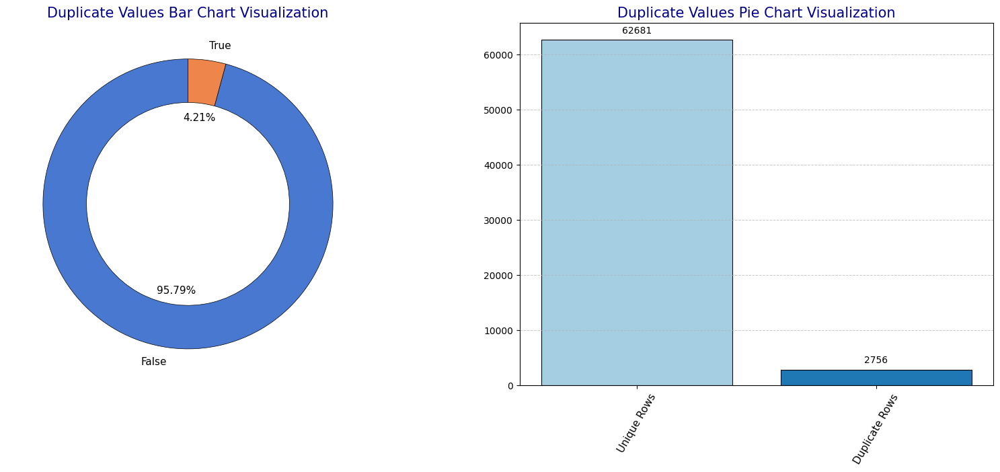

In [18]:
# Plot duplicates and non-duplicates values count
fig, (ax1, ax2) = plt.subplots(1, 2)
plot_bar_chart(duplicates_counts.index, duplicates_counts.values, title='Duplicate Values Pie Chart Visualization', ax=ax2)
plt.xticks([0, 1], ['Unique Rows', 'Duplicate Rows']);

plot_doughnut_chart(labels=duplicates_counts.index, values=duplicates_counts.values, title='Duplicate Values Bar Chart Visualization', ax=ax1)

In [19]:
# Drop all duplicates and drop the duplicate column
df = df.drop_duplicates(keep='last').drop(columns=['duplicates'])

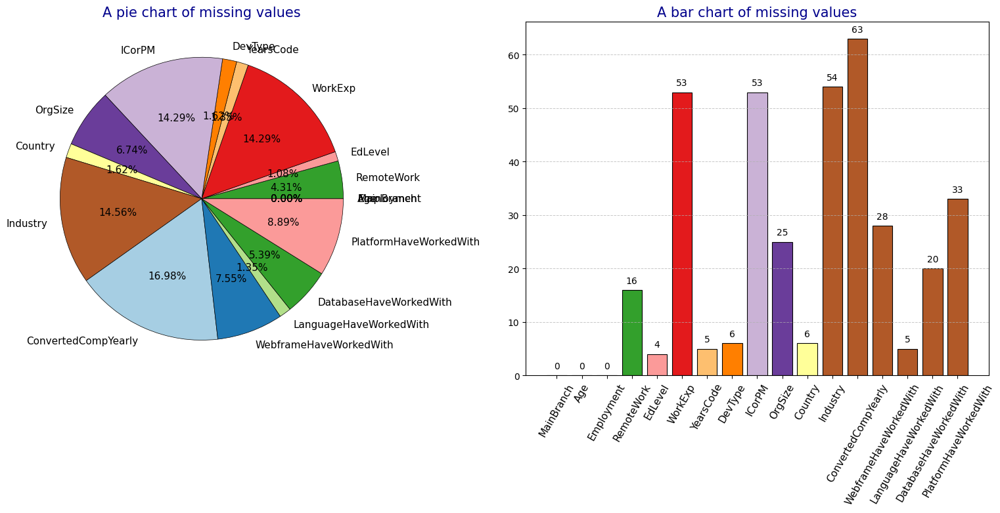

In [20]:
# Ploting missing values
fig, (ax1, ax2) = plt.subplots(1, 2)
miss_values: dict = evaluate_miss_values(df)
x = miss_values.keys()
y = miss_values.values()
plot_pie_chart(y, x, title='A pie chart of missing values', ax=ax1)

# Bar chart distribution of missing values
plot_bar_chart(x, y, title='A bar chart of missing values', ax=ax2)

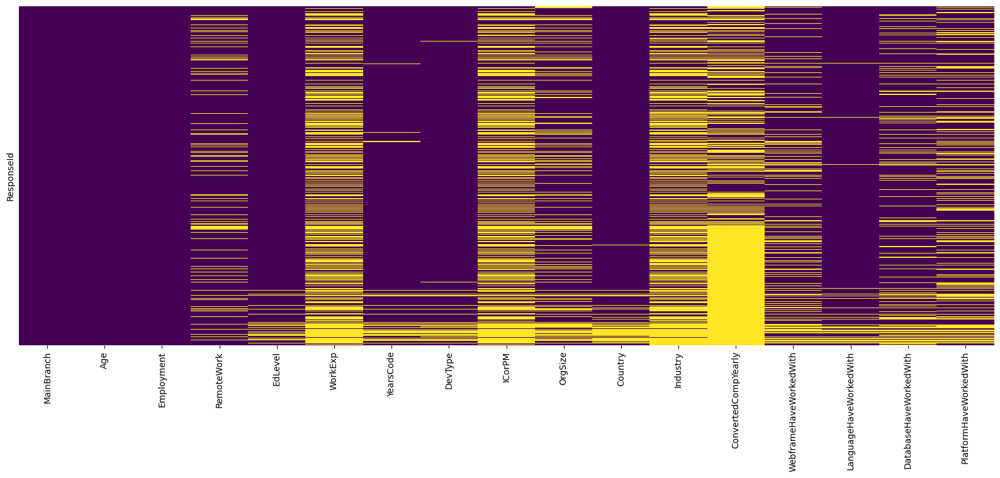

In [21]:
# Heatmap visualization of missing values
sns.heatmap(df.isnull(), yticklabels=False, cbar=False, cmap='viridis');

<span style="color:grey; font-size:20px;">Now let's handle missing values and formatting dataset</span>

In [22]:
# Checking the target column dimension
print(f'Columns with missing targrt: {df["ConvertedCompYearly"].isnull().sum()}') 
print(f'Columns with targrt:  {df["ConvertedCompYearly"].notnull().sum()}')

Columns with missing targrt: 39564
Columns with targrt:  23435


In [23]:
# Filter all rows missing values in the target column
labelled_df = df[df['ConvertedCompYearly'].notnull()].reset_index().drop(['ResponseId'], axis=1)
unlabelled_df = df[df['ConvertedCompYearly'].isnull()].reset_index().drop(['ResponseId'], axis=1)

In [24]:
# Get the dimension of the new dataset
shape = labelled_df.shape
print(f'The dataset has {shape[1]} columns and {shape[0]} rows')  

The dataset has 17 columns and 23435 rows


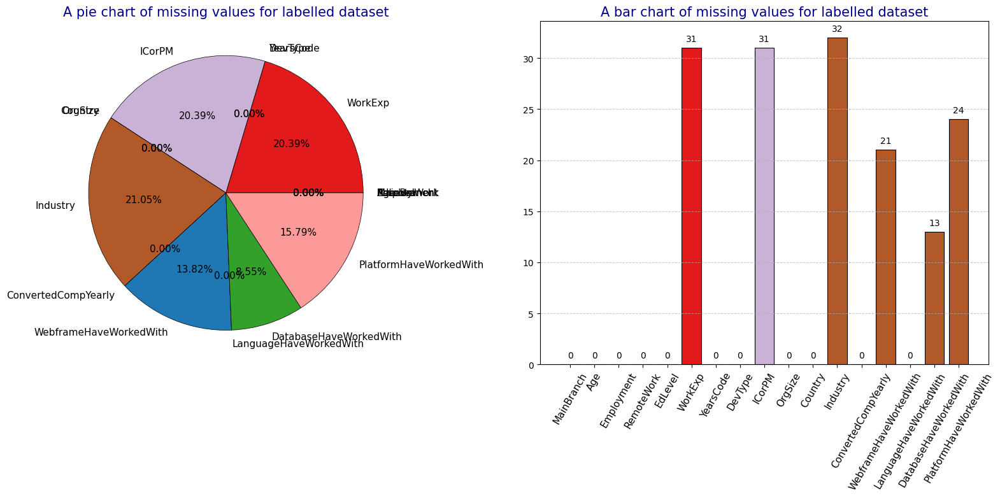

In [25]:
# Ploting missing values distribution of the labelled data
fig, (ax1, ax2) = plt.subplots(1, 2)
new_df_miss_val: dict = evaluate_miss_values(labelled_df)
x2 = new_df_miss_val.keys()
y2 = new_df_miss_val.values()
plot_pie_chart(y2, x2, title='A pie chart of missing values for labelled dataset', ax=ax1)

# Bar chart distribution of missing values of the labelled data
plot_bar_chart(x2, y2, title='A bar chart of missing values for labelled dataset', ax=ax2)

In [26]:
# Convert -> LanguageHaveWorkedWith, WebframeHaveWorkedWith, DatabaseHaveWorkedWith, PlatformHaveWorkedWith -> list
skills_cols = ['LanguageHaveWorkedWith', 'WebframeHaveWorkedWith','DatabaseHaveWorkedWith', 'PlatformHaveWorkedWith']
# Fill all missing values in skills cols with the mode and format data to list
for col in skills_cols:
    lang_mode = labelled_df[col].mode()[0]
    labelled_df[col] = labelled_df[col].fillna(lang_mode)
    labelled_df[col].isnull().sum()
    labelled_df[col] = labelled_df[col].apply(lambda a: str(a).split(';'))

In [27]:
# Convert skills list to frequency
# Let us assign weight to each language base on it popularity
# from itertools import chain

for col in skills_cols:
    labelled_df[col] = labelled_df[col].apply(lambda a: len(a))
    labelled_df[col].astype(int)

    # pop = dict()
    # for skill in chain.from_iterable(labelled_df[col]):
    #     pop[skill] = pop.get(skill, 0) + 1

    # labelled_df[col] = labelled_df[col].apply(lambda a: sum(pop[skill] for skill in a))
    # labelled_df[col].astype(int)

In [28]:
# Handling missing values on -> 'RemoteWork', 'OrgSize', 'DevType', 'PurchaseInfluence' 'ICorPM',
missValColumns = ['RemoteWork', 'OrgSize', 'DevType', 'Industry', 'WorkExp', 'ICorPM']
for col in missValColumns:
    colMode = labelled_df[col].mode()[0]
    labelled_df[col] = labelled_df[col].fillna(colMode)

labelled_df.isnull().sum()

MainBranch                 0
Age                        0
Employment                 0
RemoteWork                 0
EdLevel                    0
WorkExp                    0
YearsCode                 47
DevType                    0
ICorPM                     0
OrgSize                    0
Country                    0
Industry                   0
ConvertedCompYearly        0
WebframeHaveWorkedWith     0
LanguageHaveWorkedWith     0
DatabaseHaveWorkedWith     0
PlatformHaveWorkedWith     0
dtype: int64

In [29]:
# Get the uniques entries in work experince                
labelled_df['WorkExp'].astype(int).unique() 

array([ 3,  7,  8, 18, 30, 16, 17,  1,  4, 15, 25, 20, 10, 11, 28, 24, 12,
       23,  9, 40, 14, 27, 26,  0, 19, 22, 13, 44, 41,  2,  5,  6, 31, 36,
       29, 45, 39, 38, 35, 21, 34, 50, 32, 37, 33, 42, 46, 43, 49, 48, 47])

In [30]:
# Group workexp into junior, mid and senior level class

# labelled_df['WorkExp'] = labelled_df['WorkExp'].apply( 
#     lambda a: 'junior' if a < 5 else ('mid' if 5 <= a < 10 else 'senior'))

In [31]:
# print all uniques entries in yearcode
labelled_df['YearsCode'].unique()

array(['3', '12', '15', '27', '7', '32', '38', '23', '50', '30', '21',
       '10', '6', '40', '20', '9', '25', '14', '11', '28', '16', '18',
       '37', '47', '1', '17', '36', '19', '24', '2', '5', '34', '48',
       '46', '26', '13', '33', '31', '45', '22', '41', '35', '4', '8',
       '44', '29', '42', 'More than 50 years', '39', '43',
       'Less than 1 year', nan, '49'], dtype=object)

In [32]:
# Handle year of code missing values, formate data and covert to int()
labelled_df['YearsCode'] = labelled_df['YearsCode'].fillna(labelled_df['YearsCode'].mode()[0])
labelled_df['YearsCode'] = labelled_df['YearsCode'].replace(['More than 50 years', 'Less than 1 year'], [50, 0])
labelled_df['YearsCode']= labelled_df['YearsCode'].astype(int)

In [33]:
# Get unique entries in yearcode column
labelled_df['YearsCode'].unique()

array([ 3, 12, 15, 27,  7, 32, 38, 23, 50, 30, 21, 10,  6, 40, 20,  9, 25,
       14, 11, 28, 16, 18, 37, 47,  1, 17, 36, 19, 24,  2,  5, 34, 48, 46,
       26, 13, 33, 31, 45, 22, 41, 35,  4,  8, 44, 29, 42, 39, 43,  0, 49])

In [34]:
# Check for missing values
labelled_df.isnull().sum()

MainBranch                0
Age                       0
Employment                0
RemoteWork                0
EdLevel                   0
WorkExp                   0
YearsCode                 0
DevType                   0
ICorPM                    0
OrgSize                   0
Country                   0
Industry                  0
ConvertedCompYearly       0
WebframeHaveWorkedWith    0
LanguageHaveWorkedWith    0
DatabaseHaveWorkedWith    0
PlatformHaveWorkedWith    0
dtype: int64

<span style="color:grey; font-size:20px;">Now let's check outliers on numerical columns</span>

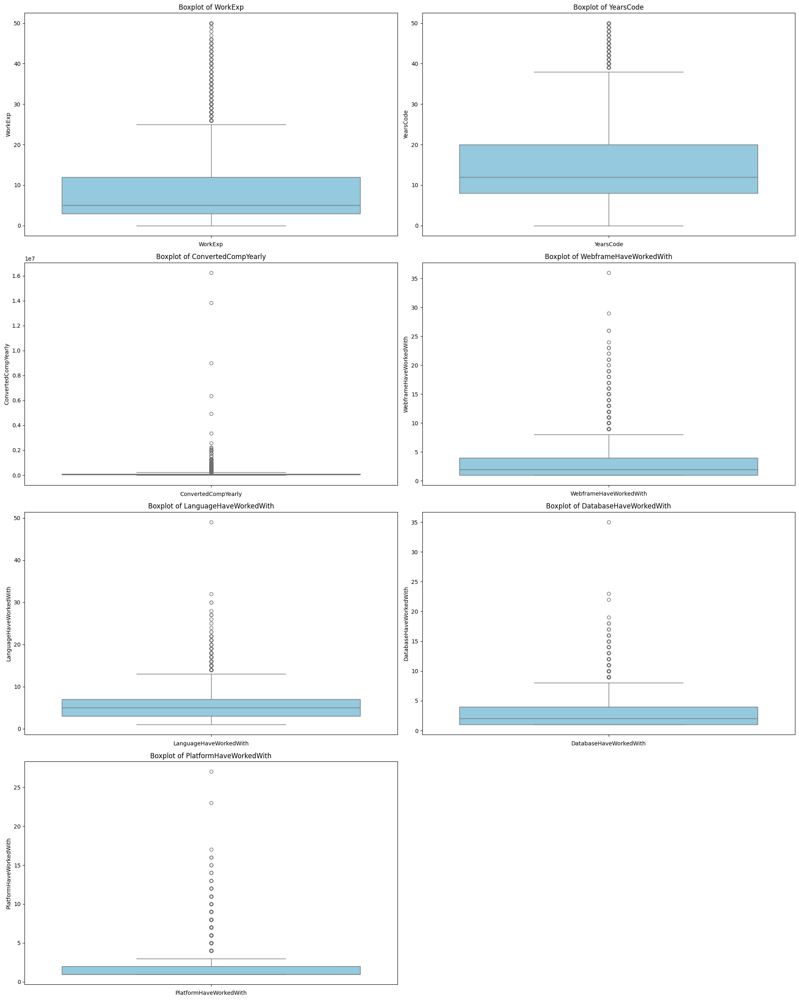

In [35]:
# Get all numerical columns
numerical_cols = labelled_df.select_dtypes(include=['number']).columns

# Loop through the numerical columns and plot box plots for each
plt.figure(figsize=(20, 25)) 
for i, col in enumerate(numerical_cols):
    plt.subplot(len(numerical_cols) // 2 + 1, 2, i + 1) 
    sns.boxplot(data=labelled_df[col], color='skyblue') 
    plt.title(f'Boxplot of {col}') 
    plt.xlabel(col) 
plt.tight_layout() 

In [36]:
# Handle outliers by replacing erroneous values with the mean of the column
outliers_cols = {'WorkExp':20, 'YearsCode':33, 'ConvertedCompYearly':250000, 'WebframeHaveWorkedWith':8,
       'LanguageHaveWorkedWith':13, 'DatabaseHaveWorkedWith':8,
       'PlatformHaveWorkedWith':4}

for col, value in outliers_cols.items():
   labelled_df[col] = labelled_df[col].apply(lambda x: labelled_df[col].mean() if x > value else x )

<span style="color:brown; font-size:25px;">Clasify salary as high pay or low pay </span>

In [37]:
# Clasify salary as high pay or low pay
labelled_df['compensationClass'] = labelled_df['ConvertedCompYearly'].apply(lambda a: 0 if a < 55000 else 1)

<span style="color:brown; font-size:20px;">Univariate Analysis</span>

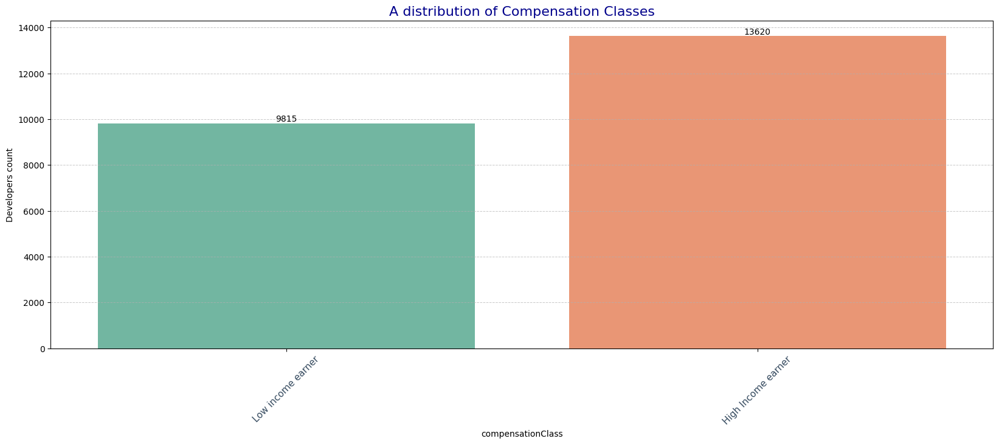

In [38]:
# A dictribution of compensation class into low and high income earners
plot_count_plot(labelled_df, 'compensationClass', 'A distribution of Compensation Classes')
plt.xticks([0, 1], ['Low income earner', 'High Income earner']);
plt.ylabel(ylabel='Developers count');

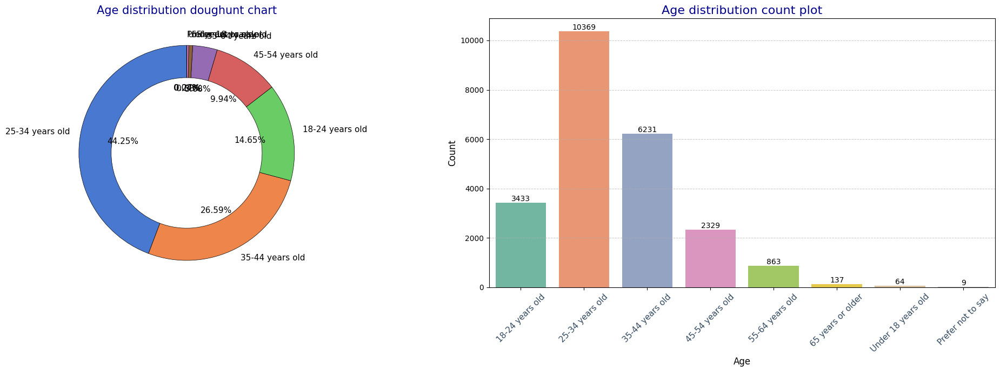

In [39]:
# Age distribution by age range
fig, (ax1, ax2) = plt.subplots(1, 2)

plot_count_plot(labelled_df, 'Age', 'Age distribution count plot', ax=ax2);
plt.xlabel('Age', fontsize=12);
plt.ylabel('Count', fontsize=12);

values = labelled_df['Age'].value_counts()
labels = values.index
plot_doughnut_chart(values, labels,"Age distribution doughunt chart",  ax=ax1);
plt.tight_layout()

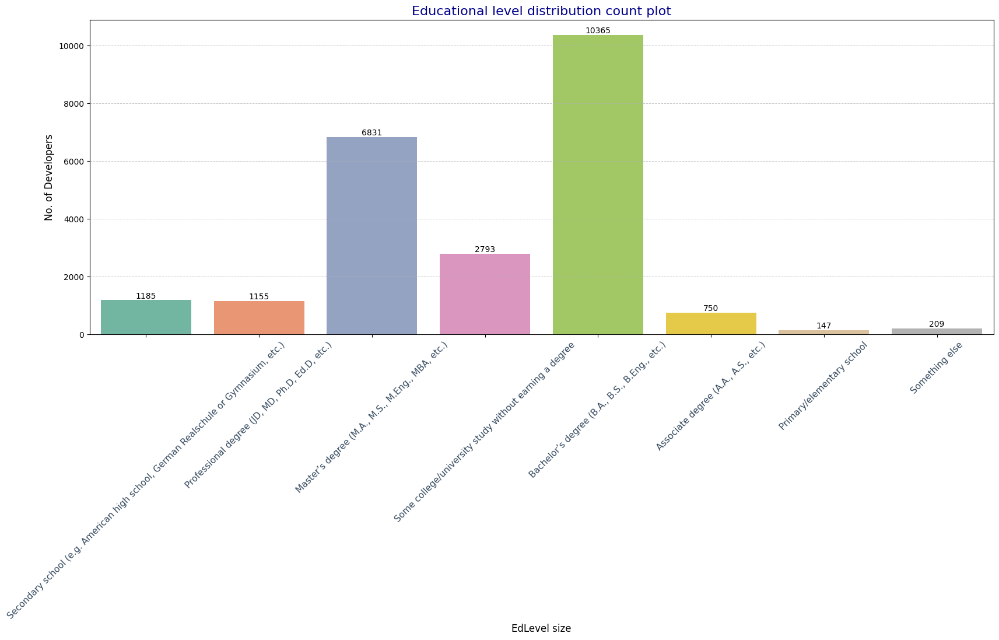

In [40]:
# Educational level distribution
plot_count_plot(labelled_df, 'EdLevel', 'Educational level distribution count plot')
plt.xlabel('EdLevel size', fontsize=12)
plt.ylabel('No. of Developers', fontsize=12);

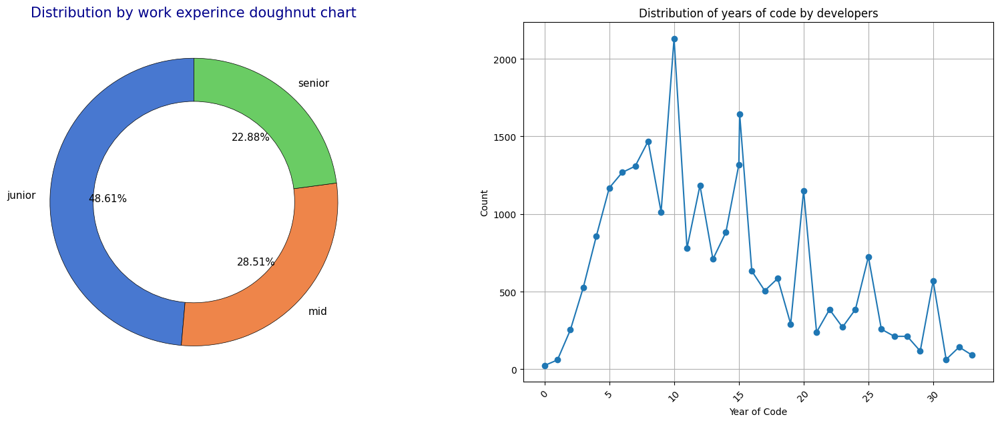

In [41]:
# Distribution of years of code by developers
fig, (ax1, ax2) = plt.subplots(1, 2)
duration_value = labelled_df.groupby('YearsCode')['YearsCode'].value_counts()

duration_value.plot(kind='line', marker='o', ax=ax2)
plt.title('Distribution of years of code by developers')
plt.xlabel('Year of Code')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.grid(True)

# Chart of work experince of developer grouped into junior, mid and senior level
values = labelled_df['WorkExp'].apply( 
    lambda a: 'junior' if a < 5 else ('mid' if 5 <= a < 10 else 'senior')).value_counts()

labels = values.index
plot_doughnut_chart(values, labels,"Distribution by work experince doughnut chart", ax=ax1)

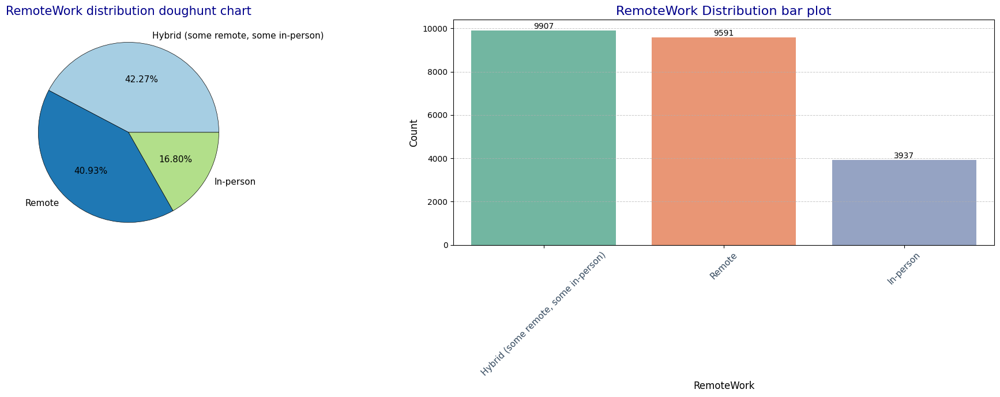

In [42]:
# Distribution of remote work
fig, (ax1, ax2) = plt.subplots(1, 2)

plot_count_plot(labelled_df, 'RemoteWork', 'RemoteWork Distribution bar plot', ax=ax2);
plt.xlabel('RemoteWork', fontsize=12);
plt.ylabel('Count', fontsize=12);

values = labelled_df['RemoteWork'].value_counts()
labels = values.index
plot_pie_chart(values, labels,"RemoteWork distribution doughunt chart",  ax=ax1);
plt.tight_layout()

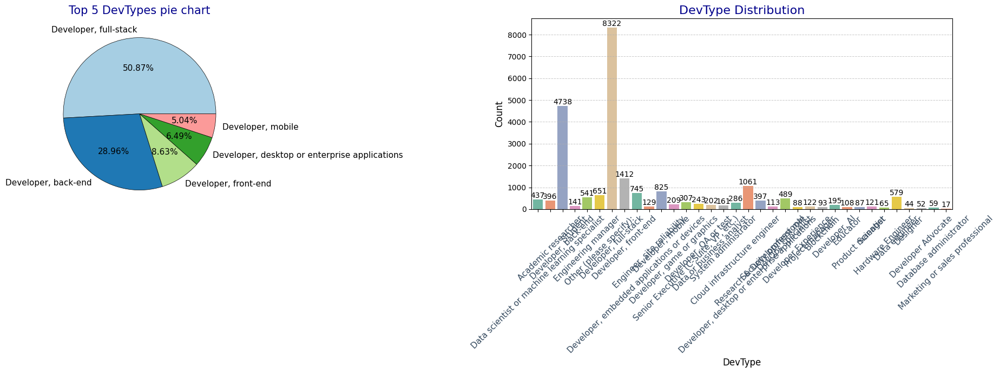

In [43]:
# Distribution of DevType and 
fig, (ax1, ax2) = plt.subplots(1, 2)
plot_count_plot(labelled_df, 'DevType', 'DevType Distribution', ax=ax2);
plt.xlabel('DevType', fontsize=12);
plt.ylabel('Count', fontsize=12);

values = labelled_df['DevType'].value_counts()
labels = values.index
plot_pie_chart(values[:5], labels[:5],"Top 5 DevTypes pie chart",  ax=ax1);
plt.tight_layout()

<span style="color:brown; font-size:20px;">Bivariate & Multivariate Analysis</span>

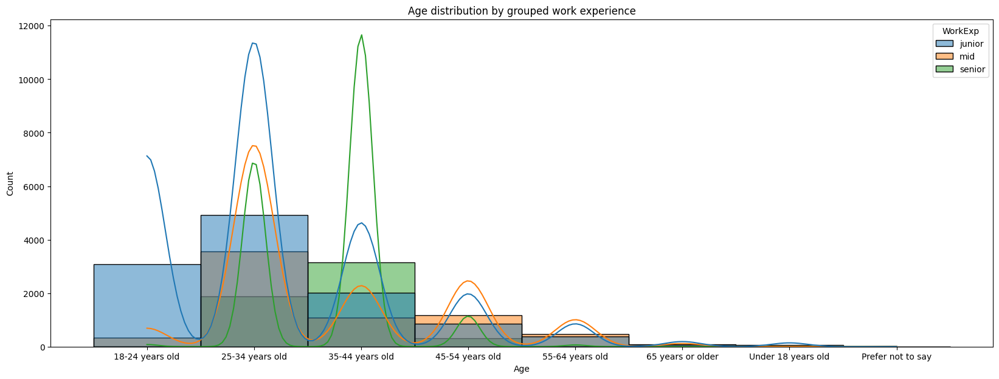

In [44]:
# Analyze the distribution of ages across different WorkExp.
# Group work experience into three class, junior, mid and senior
workExp = labelled_df['WorkExp'].apply( 
    lambda a: 'junior' if a < 5 else ('mid' if 5 <= a < 10 else 'senior'))
# Plot a histogram of the distribution
sns.histplot(data=labelled_df, x='Age', hue=workExp, kde=True, bins=20)
plt.title('Age distribution by grouped work experience');

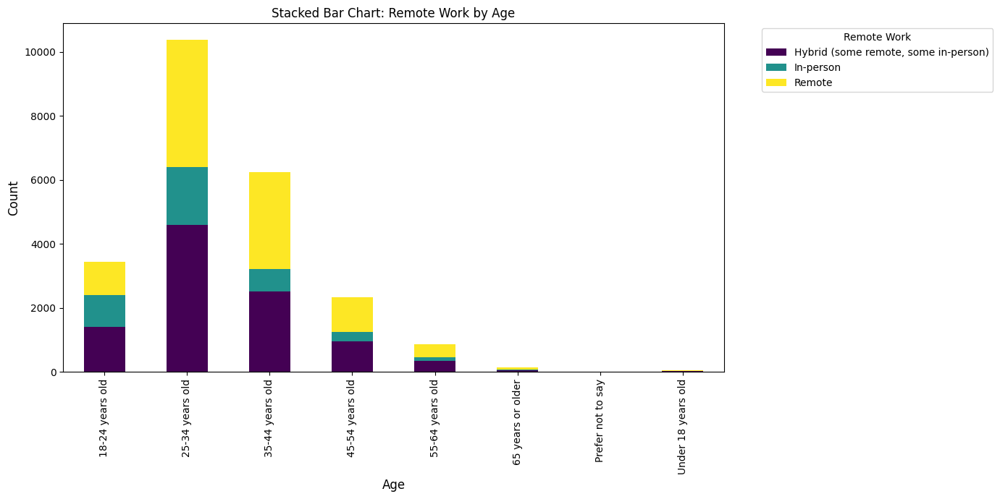

In [45]:
# Stacked bar chart of remote work and age distribution
ratings = labelled_df.groupby(['RemoteWork', 'Age']).size().reset_index().rename(columns={0:'count'})

stacked_data = ratings.pivot_table(index='Age', columns='RemoteWork', values='count', aggfunc='sum', fill_value=0)

stacked_data.plot(kind='bar', stacked=True, figsize=(14, 7), colormap='viridis')
plt.title('Stacked Bar Chart: Remote Work by Age', fontsize=12)
plt.xlabel('Age', fontsize=12)
plt.ylabel('Count', fontsize=12)
plt.legend(title='Remote Work', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout();

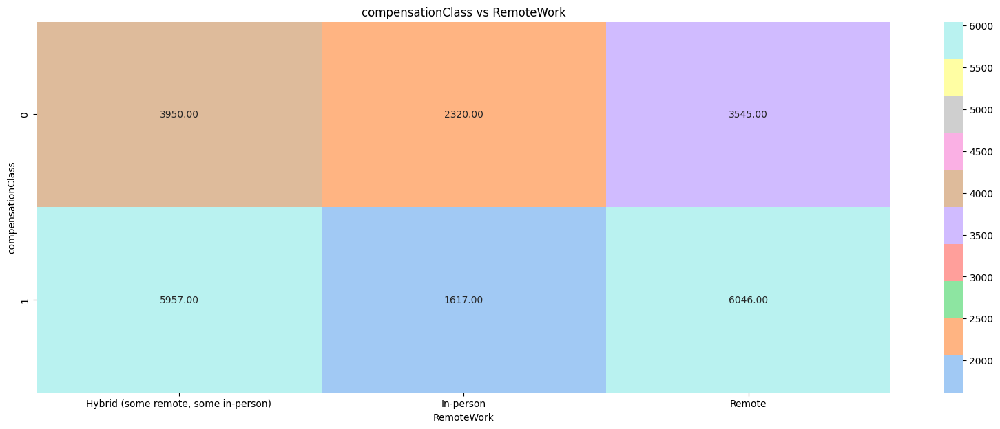

In [46]:
# Heatmap distribution of remote work over compensation class 
family_treatment = labelled_df.groupby(['compensationClass', 'RemoteWork']).size().unstack()
sns.heatmap(family_treatment, annot=True, fmt='.2f', cmap=sns.color_palette('pastel'))
plt.title('compensationClass vs RemoteWork');

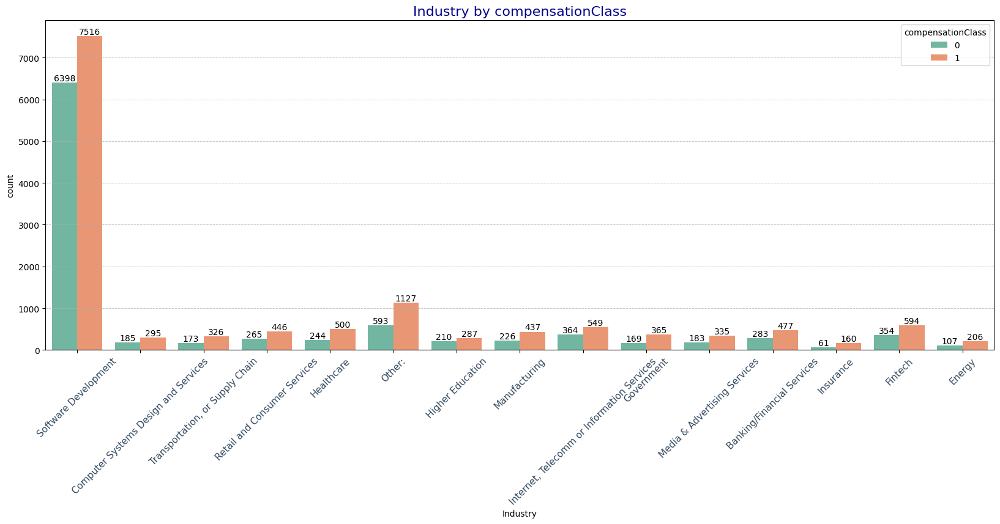

In [47]:
# Industry distribution by compensationClass
plot_count_plot(data=labelled_df, x='Industry', hue='compensationClass', title='Industry by compensationClass')

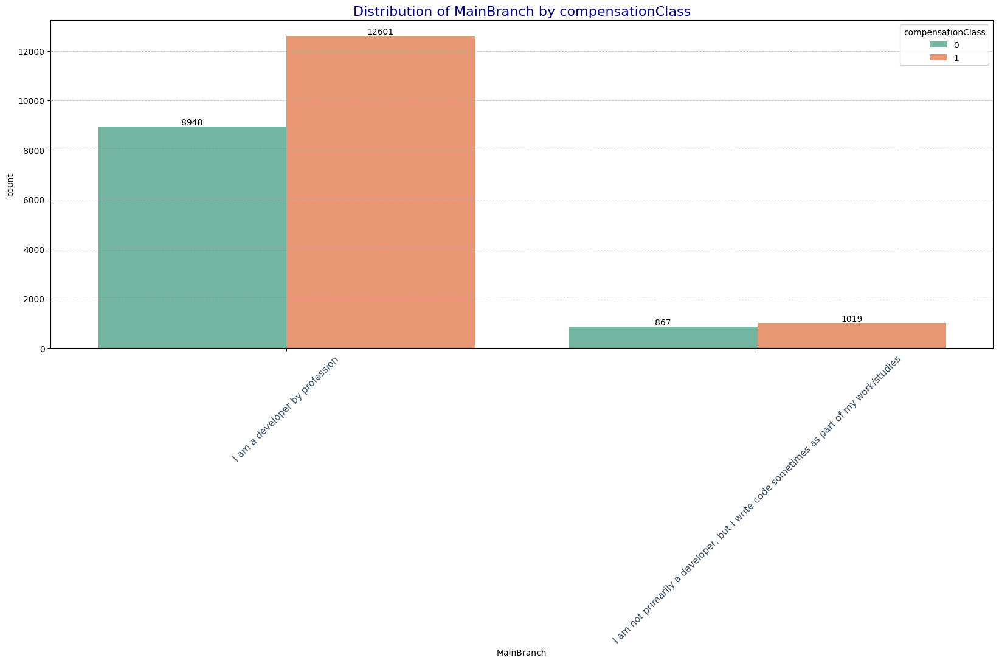

In [48]:
# Distribution of MainBranch by compensationClass
plot_count_plot(labelled_df, 'MainBranch', 'Distribution of MainBranch by compensationClass', hue='compensationClass');

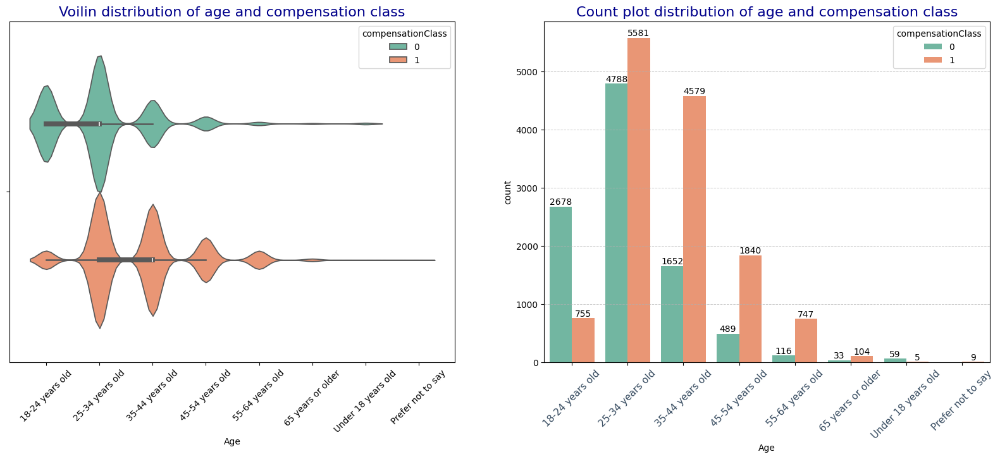

In [49]:
# Distribution of age and compensation class
fig, (ax1, ax2) = plt.subplots(1, 2)

plot_violin_plot(labelled_df, 'Age', 'Voilin distribution of age and compensation class', hue='compensationClass', ax=ax1);

plot_count_plot(labelled_df, 'Age', 'Count plot distribution of age and compensation class', hue='compensationClass', ax=ax2);
# plt.xticks(ticks=[0, 1], labels=['Low Compensation', 'High Compensation'], rotation=0, fontsize=10);

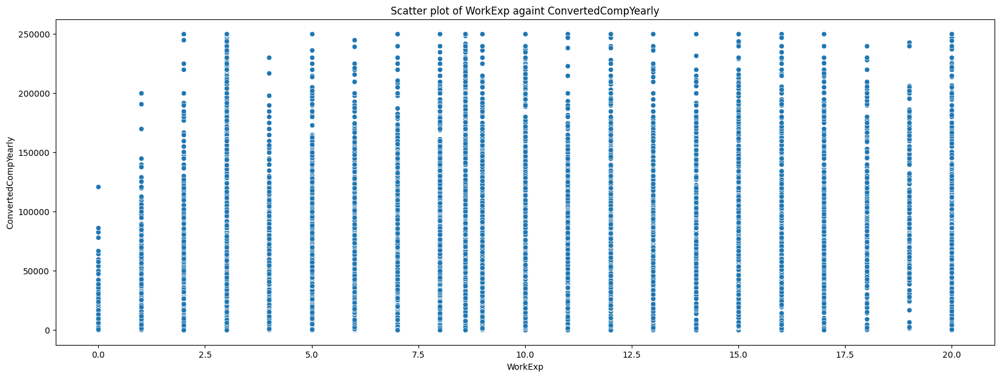

In [50]:
# Scatter plot of WorkExp againt ConvertedCompYearly
plt.title(label='Scatter plot of WorkExp againt ConvertedCompYearly')
sns.scatterplot(data = labelled_df, x = 'WorkExp', y = 'ConvertedCompYearly');

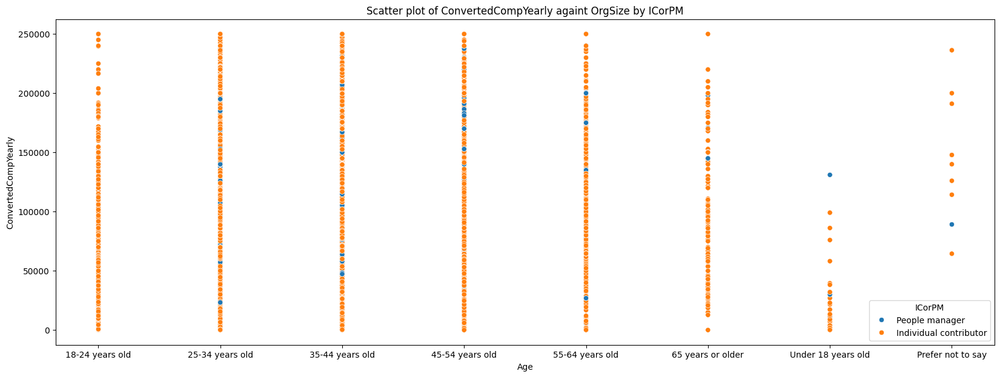

In [51]:
# Scatter plot of ConvertedCompYearly againt OrgSize by ICorPM
plt.title(label='Scatter plot of ConvertedCompYearly againt OrgSize by ICorPM')
sns.scatterplot(data = labelled_df, y = 'ConvertedCompYearly', x = 'Age', hue = 'ICorPM');

### Data Transformation

In [52]:
# LabelEncode categorical columns
from sklearn.preprocessing import LabelEncoder
encode = LabelEncoder()

balelEncodeColumns = labelled_df.select_dtypes(include=['object']).columns.tolist()
# Endcode all categorical columns except -> 'Age', 'OrgSize', 'EdLevel'
balelEncodeColumns = [col for col in balelEncodeColumns if col not in ['Age', 'OrgSize', 'EdLevel'] ]

for col in balelEncodeColumns:
    labelled_df[col] = encode.fit_transform(labelled_df[col])

# for col in strColumns:
#     unique = {v:k for k,v in enumerate(new_df[col].unique())}
#     new_df[col].map(unique)

In [53]:
# Ordinal Encoding age, EdLevel and orgsize
age_group = {
    'Under 18 years old': 0,
    '18-24 years old': 1,
    '25-34 years old': 2,
    '35-44 years old': 3,
    '45-54 years old': 4,
    '55-64 years old': 5,
    '65 years or older': 6,
    'Prefer not to say': -1
}

orgSize_group = {
    'Just me - I am a freelancer, sole proprietor, etc.': 0,
    '2 to 9 employees': 1,
    '10 to 19 employees': 2,
    '20 to 99 employees': 3,
    '100 to 499 employees': 4,
    '500 to 999 employees': 5,
    '1,000 to 4,999 employees': 6,
    '5,000 to 9,999 employees': 7,
    '10,000 or more employees': 8,
    'I don’t know': 9
}

education_group = {
    'Primary/elementary school': 0,
    'Secondary school (e.g. American high school, German Realschule or Gymnasium, etc.)': 1,
    'Some college/university study without earning a degree': 2,
    'Associate degree (A.A., A.S., etc.)': 3,
    'Bachelor’s degree (B.A., B.S., B.Eng., etc.)': 4,
    'Master’s degree (M.A., M.S., M.Eng., MBA, etc.)': 5,
    'Professional degree (JD, MD, Ph.D, Ed.D, etc.)': 6,
    'Something else': 7
}

labelled_df['EdLevel'] = labelled_df['EdLevel'].map(education_group)
labelled_df['Age'] = labelled_df['Age'].map(age_group)
labelled_df['OrgSize'] = labelled_df['OrgSize'].map(orgSize_group)

In [54]:
labelled_df.head()

,MainBranch,Age,Employment,RemoteWork,EdLevel,WorkExp,YearsCode,DevType,ICorPM,OrgSize,Country,Industry,ConvertedCompYearly,WebframeHaveWorkedWith,LanguageHaveWorkedWith,DatabaseHaveWorkedWith,PlatformHaveWorkedWith,compensationClass
0,0,1,18,0,1,3.0,3.0,5,1,4,112,13,7322.0,7.0,11.0,3.0,2.000000,0
1,1,2,0,0,6,3.0,12.0,0,0,4,9,13,30074.0,1.0,6.0,1.0,1.000000,0
2,0,3,0,2,5,7.0,15.0,5,0,3,151,1,91295.0,3.0,5.0,3.0,2.001451,1
3,0,3,28,2,5,3.0,27.0,13,0,0,52,13,53703.0,1.0,1.0,4.0,2.000000,0
4,0,2,24,2,2,8.0,7.0,32,0,2,158,14,110000.0,4.0,5.0,3.0,1.000000,1


### Checking correlations

In [55]:
# Checking correlation of all independent variable against the dependent variable
corr = correlations(labelled_df, 'ConvertedCompYearly')
corr

{'MainBranch': -0.032,
 'Age': 0.37,
 'Employment': -0.15,
 'RemoteWork': 0.074,
 'EdLevel': 0.084,
 'WorkExp': 0.26,
 'YearsCode': 0.392,
 'DevType': 0.015,
 'ICorPM': 0.059,
 'OrgSize': 0.164,
 'Country': 0.277,
 'Industry': -0.072,
 'WebframeHaveWorkedWith': -0.07,
 'LanguageHaveWorkedWith': 0.038,
 'DatabaseHaveWorkedWith': -0.033,
 'PlatformHaveWorkedWith': 0.021,
 'compensationClass': 0.747}

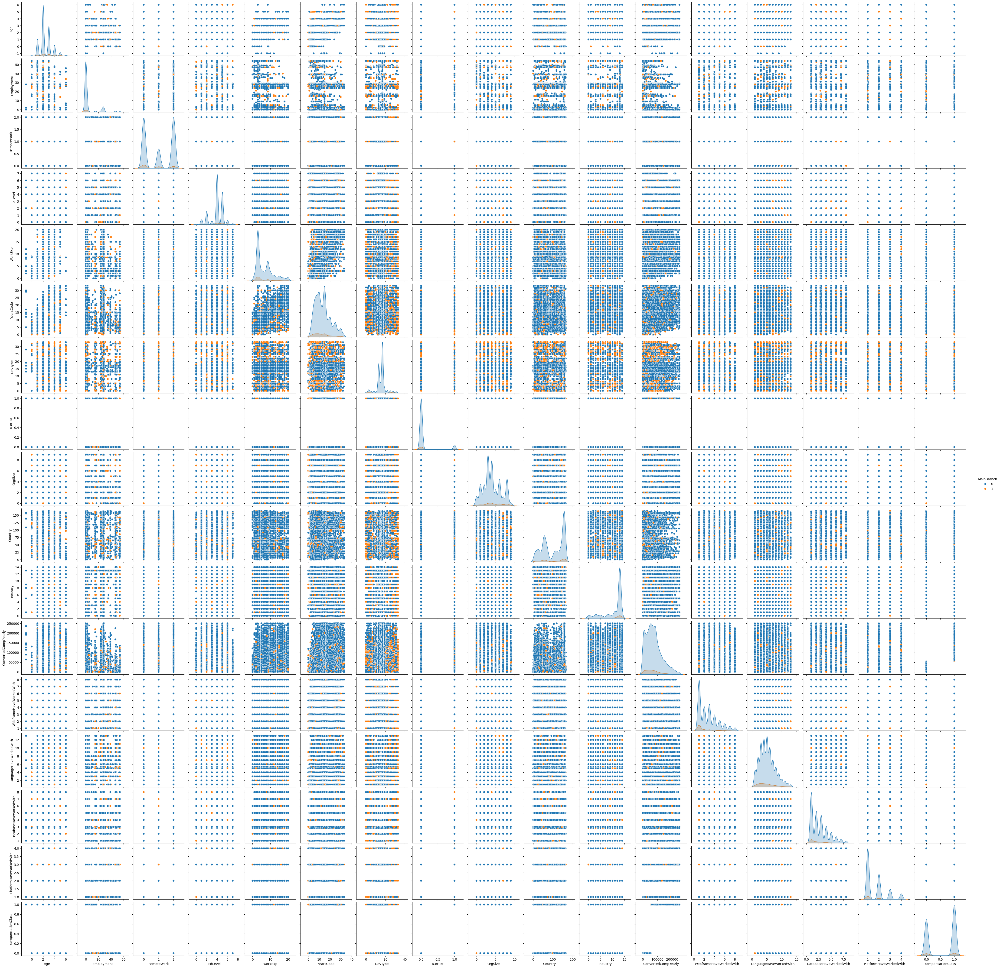

In [56]:
# Ploting a pair plot
sns.pairplot(labelled_df, hue='MainBranch')

### Split dataset into features (input variables) and target (output variable), then into training, validation and test sets, followed by normalizing the data

In [57]:
# Split dataset into test and train and normalization using minmaxscale
def preprocess_data(x, y):
    from sklearn.model_selection import train_test_split
    from sklearn.preprocessing import MinMaxScaler

    global X_test, X_train

    # Init MinMax
    scale = MinMaxScaler()

    # Split dataset
    X_train, X_test, y_train, y_test = train_test_split(x, y, test_size=0.3, random_state = 10)

    # Fit scaler on the entire training data
    scale = scale.fit(X_train)
    x_train = scale.transform(X_train)
    
    x_test = scale.transform(X_test)

    return x_train, x_test, y_train, y_test

In [58]:
# Split feature from target variable
xFeature = labelled_df.drop(['ConvertedCompYearly', 'compensationClass'], axis=1)

yTarget_reg = labelled_df['ConvertedCompYearly'] # Regression
yTarget_cls = labelled_df['compensationClass'] # Classification

In [59]:
xFeature.isnull().sum()

MainBranch                0
Age                       0
Employment                0
RemoteWork                0
EdLevel                   0
WorkExp                   0
YearsCode                 0
DevType                   0
ICorPM                    0
OrgSize                   0
Country                   0
Industry                  0
WebframeHaveWorkedWith    0
LanguageHaveWorkedWith    0
DatabaseHaveWorkedWith    0
PlatformHaveWorkedWith    0
dtype: int64

In [60]:
# Split dataset into test,main train and validation train dataset
x_train, x_test, y_train, y_test = preprocess_data(xFeature.copy(), yTarget_cls.copy())

In [61]:
x_train.shape, y_train.shape

((16404, 16), (16404,))

#### Baseline Model: Logistic regression

In [62]:
# Lets build a baseline model
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score,f1_score

def train_baseline_model(x_train, y_train, x_test, y_test):
    lgg = LogisticRegression()
    
    # Fit the model on the training data
    lgg.fit(x_train, y_train)
    
    # Make predictions
    pred_train = lgg.predict(x_train)
    pred_test = lgg.predict(x_test)
    
    # Calculate F1 scores
    train_f1 = round(f1_score(y_train, pred_train), 3)
    val_f1 = round(f1_score(y_test, pred_test), 3)
    
    return {"train": train_f1, "test": val_f1}

In [63]:
# Reference baseline model training
reference_model = train_baseline_model(x_train, y_train, x_test, y_test)
reference_model

{'train': np.float64(0.77), 'test': np.float64(0.77)}

### Feature selection

<span style="color:brown; font-size:20px;">Using variance for feature selection</span>

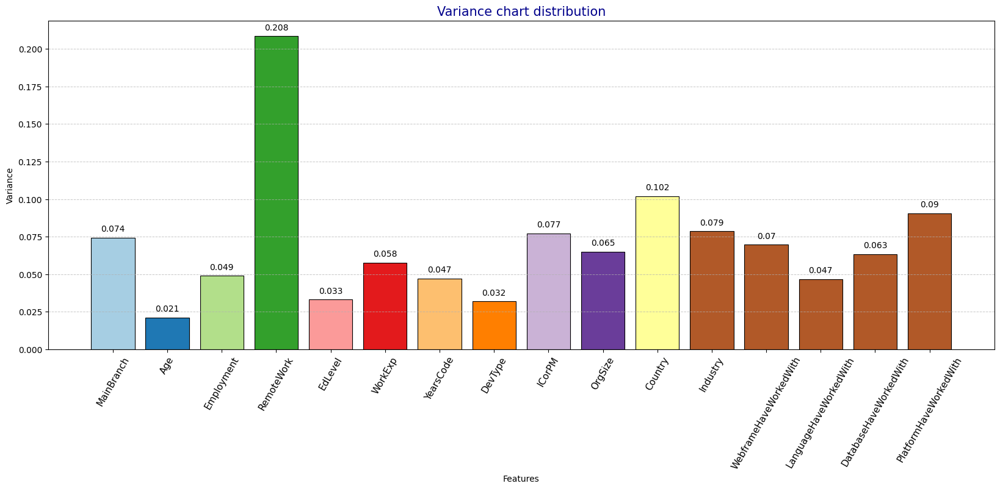

In [64]:
# Find variance and plot the variance for each column
variance = x_train.var(axis=0) # y
columns = xFeature.columns

plot_bar_chart(x = columns, y=variance, title='Variance chart distribution')
plt.xlabel('Features')
plt.ylabel('Variance');

<span style="color:brown; font-size:17px;">Drop columns with variance less than 0.025%</span>

In [65]:
# Make a copy of xFeatures and drop columns
xFeature_copy1 = xFeature.copy().drop(columns=['Age'], axis=1)

# Prepare data for training
x_train, x_test, y_train, y_test = preprocess_data(xFeature_copy1, yTarget_cls.copy())

len(x_train[0]), len(x_test[0])

(15, 15)

In [66]:
# Train a baseline model with low variance column
var_model = train_baseline_model(x_train, y_train, x_test, y_test)
var_model

{'train': np.float64(0.763), 'test': np.float64(0.764)}

In [67]:
# The model performs better with the column - > 'Age'
# Low variance doesn't always mean low importance.

print(f"Reference model is better by {round(reference_model['train'] - var_model['train'], 3)} on training data")
print(f"Reference model is better by {round(reference_model['test'] - var_model['test'], 3)} on test data")

Reference model is better by 0.007 on training data
Reference model is better by 0.006 on test data


<span style="color:brown; font-size:20px;">Random Forest for Feature Selection</span>

###### Random Forest will help you identify the most important features based on how well each feature contributes to the model’s accuracy

In [68]:
# Prepare data for training
x_train, x_test, y_train, y_test = preprocess_data(xFeature, yTarget_cls.copy())

len(x_train[0]), len(x_test[0])

(16, 16)

In [69]:
from sklearn.ensemble import RandomForestClassifier

rfc = RandomForestClassifier()

rfc.fit(x_train, y_train)
importance = rfc.feature_importances_

# Display feature importances
for i, val in enumerate(importance):
    print(f'{xFeature.columns[i]} ->\t {val:.3f}')

MainBranch ->	 0.008
Age ->	 0.066
Employment ->	 0.037
RemoteWork ->	 0.025
EdLevel ->	 0.040
WorkExp ->	 0.077
YearsCode ->	 0.145
DevType ->	 0.061
ICorPM ->	 0.007
OrgSize ->	 0.058
Country ->	 0.258
Industry ->	 0.038
WebframeHaveWorkedWith ->	 0.045
LanguageHaveWorkedWith ->	 0.059
DatabaseHaveWorkedWith ->	 0.046
PlatformHaveWorkedWith ->	 0.030


In [70]:
# Drop columns with importance lower than 0.01
xFeature = xFeature.drop(['ICorPM', 'MainBranch'], axis=1)
# Prepare data for training
x_train, x_test, y_train, y_test = preprocess_data(xFeature, yTarget_cls.copy())

In [71]:
# Train baseline model with important columns -> random forest
rfc_model = train_baseline_model(x_train, y_train, x_test, y_test)
rfc_model

{'train': np.float64(0.77), 'test': np.float64(0.769)}

In [72]:
# The model performed well on both test and train
print(f"Reference model is less by {round(reference_model['train'] - rfc_model['train'], 3)} on training data")
print(f"Reference model is less by {round(reference_model['test'] - rfc_model['test'], 3)} on test data")

Reference model is less by 0.0 on training data
Reference model is less by 0.001 on test data


<span style="color:brown; font-size:17px;">Using K-best feature selection method</span>

In [73]:
# K-best feature selection 
from sklearn.feature_selection import SelectKBest, mutual_info_classif

k_best = len(xFeature.columns) + 1
k_scores = []

lgg = LogisticRegression()

for k in range(1, k_best):
    selector =  SelectKBest(mutual_info_classif, k=k)
    selector.fit(x_train, y_train)
    
    selector_train = selector.transform(x_train)
    selector_test = selector.transform(x_test)

    lgg_v3 = lgg.fit(selector_train, y_train)
    pred_selector_test = lgg_v3.predict(selector_test)

    # kbest test accuracy score
    selector_score_test = round(accuracy_score(y_test, pred_selector_test), 4)

    k_scores.append(selector_score_test)

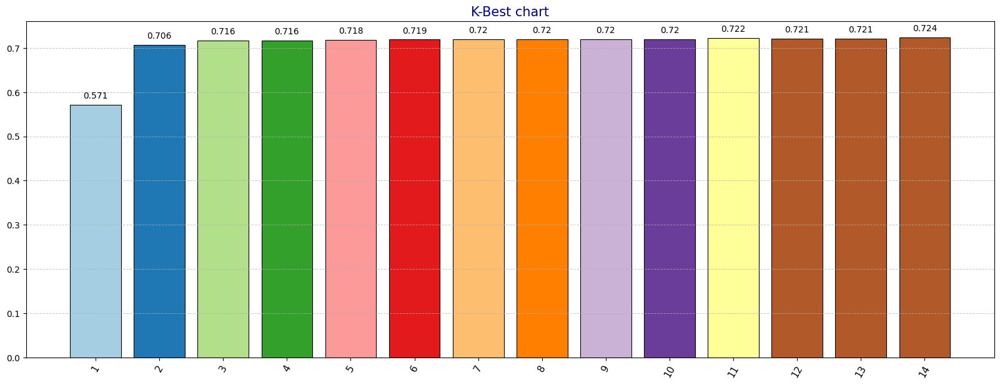

In [74]:
# Plot a bar chart of K values
plot_bar_chart(range(k_best-1), k_scores, 'K-Best chart')
plt.xticks(range(k_best-1), range(1, k_best));

In [75]:
# Lets get the k best value
# The optimal value of K is 14, there all features are found to be important
max_value = max(k_scores)
max_index = k_scores.index(max_value) + 1

max_index

14

### Cluster analysis

<span style="color:brown; font-size:17px;">KMeans Cluster</span>

In [76]:
xFeature_copy2 = xFeature

# Prepare data for training
x_train, x_test, y_train, y_test = preprocess_data(xFeature_copy2, yTarget_cls)

In [77]:
# Lets evaluate the within cluster sum of square using KMeans
# Simple, fast, and works well for spherical clusters.
from sklearn.cluster import KMeans

def calculate_wcss(init, x_train, n_clusters_range=(1, 10)):
    wcss = []
    for n in range(*n_clusters_range):
        kmeans = KMeans(n_clusters=n, init=init, random_state=10)
        kmeans.fit(x_train)
        wcss.append(kmeans.inertia_)
    return wcss

wcss_Kplus = calculate_wcss('k-means++', x_train)
wcss_rand = calculate_wcss('random', x_train)

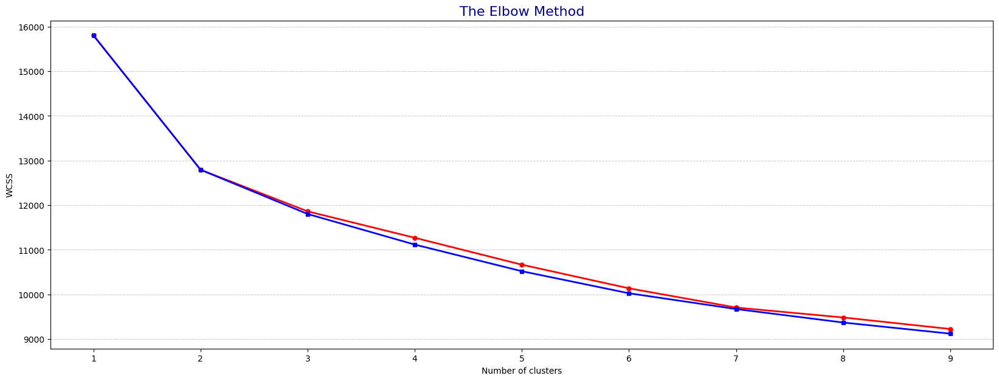

In [78]:
# Plot the graph of within sum of cluster usinf KMean++ and random
# The abrupt change was visible on  K = 2
plot_line_graph(range(1, 10),  wcss_Kplus, 'o-r')
plot_line_graph(range(1, 10),  wcss_rand, 's-b', 'The Elbow Method', 'Number of clusters', 'WCSS')

In [79]:
# Lets check if K = 2 is valid or not
kmeans_clusters = KMeans(n_clusters=2, init='k-means++', random_state=10)
kmeans_clusters.fit(x_train)

kmeans_train_labels = kmeans_clusters.predict(x_train)
kmeans_test_labeles = kmeans_clusters.predict(x_test)

In [80]:
# Computing the silhouette and accuracy of our KMeans cluster classification
from sklearn.metrics import silhouette_score

kMeans_train_score = silhouette_score(x_train, kmeans_train_labels)
kMeans_test_score = silhouette_score(x_test, kmeans_test_labeles)

print(f'Silhouette train score: {kMeans_train_score:.2f}')
print(f'Silhouette test score: {kMeans_test_score:.2f}')

Silhouette train score: 0.19
Silhouette test score: 0.18


In [81]:
# Make a copy of the train data set for cluster description
kmeans_df = X_train.copy()
kmeans_df['cluster'] = kmeans_train_labels 
# decribe the data kmeans with respect to age and work experince 
kmeans_df.groupby(['cluster'])[['WorkExp', 'Age']].describe()

WorkExp                                                         Age  \
          count      mean       std  min  25%  50%        75%   max   count   
cluster                                                                       
0        6986.0  7.291843  4.971684  0.0  3.0  6.0  10.000000  20.0  6986.0   
1        9418.0  6.287761  4.622802  0.0  3.0  4.0   8.595861  20.0  9418.0   

                                                      
             mean       std  min  25%  50%  75%  max  
cluster                                               
0        2.582880  1.024574 -1.0  2.0  2.0  3.0  6.0  
1        2.338395  1.001461 -1.0  2.0  2.0  3.0  6.0

<span style="color:brown; font-size:17px;">DBScan Cluster</span>

In [82]:
# Computing the number of clusters using DBScan cluster method
from sklearn.cluster import DBSCAN
import numpy as np

eps = [0.5, 0.6, 0.7, 0.8, 0.9, 1.0, 1.1, 1.2, 1.3, 1.4]
min_samples = range(1, 5)

best_eps = None
best_min_samples = None
best_score = -1

for ep in eps:
    for sample in min_samples:
        dbscan = DBSCAN(eps=ep, min_samples=sample)
        dbscan_clusters = dbscan.fit_predict(x_train)
        
        if len(np.unique(dbscan_clusters)) > 1:
            score_value = round(silhouette_score(x_train, dbscan_clusters), 2)

            if score_value > best_score:
                best_eps, best_min_samples, best_score = ep, sample, score_value

print(best_eps, best_min_samples, best_score)


0.9 2 0.26


In [83]:
dbscan_clusters

array([0, 0, 0, ..., 0, 0, 0])

In [84]:
# Make a copy of the train data set for cluster description
dbscan_df = X_train.copy()
dbscan_df['cluster'] = dbscan_clusters 
# decribe the data dbscan with respect to age and work experince 
dbscan_df.groupby(['cluster'])[['WorkExp', 'Age']].describe()

WorkExp                                                    Age  \
           count      mean       std  min  25%  50%  75%   max    count   
cluster                                                                   
0        16404.0  6.715371  4.800097  0.0  3.0  5.0  9.0  20.0  16404.0   

                                                      
             mean       std  min  25%  50%  75%  max  
cluster                                               
0        2.442514  1.018538 -1.0  2.0  2.0  3.0  6.0

<span style="color:brown; font-size:17px;">Silhouette Analysis</span>

For n_clusters = 2, Silhouette Score = 0.186
For n_clusters = 3, Silhouette Score = 0.142
For n_clusters = 4, Silhouette Score = 0.131
For n_clusters = 5, Silhouette Score = 0.128
For n_clusters = 6, Silhouette Score = 0.121


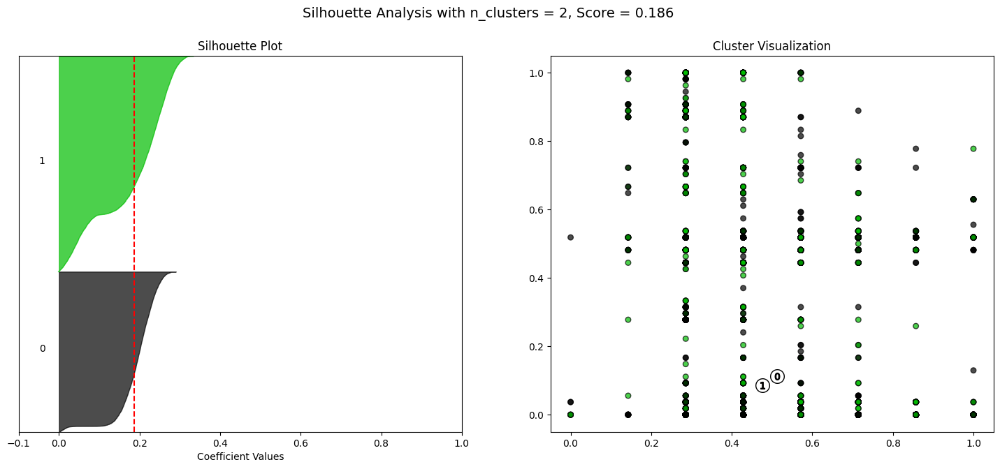

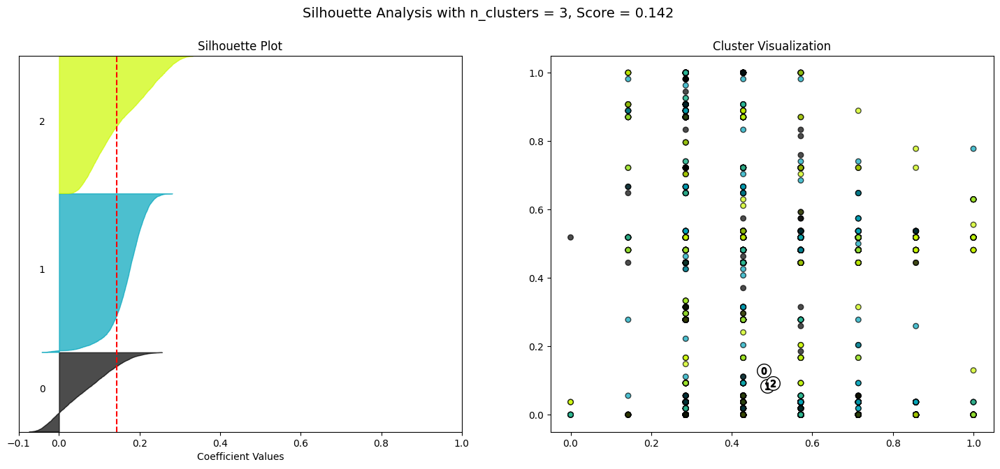

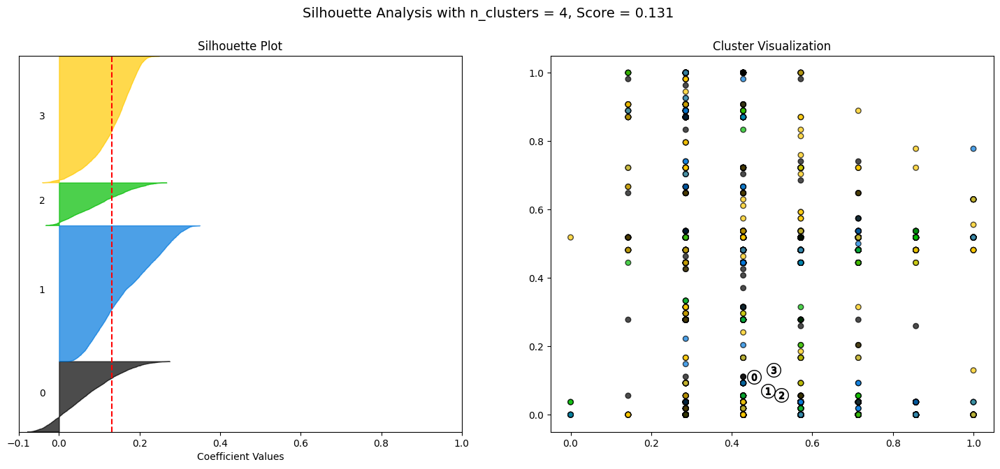

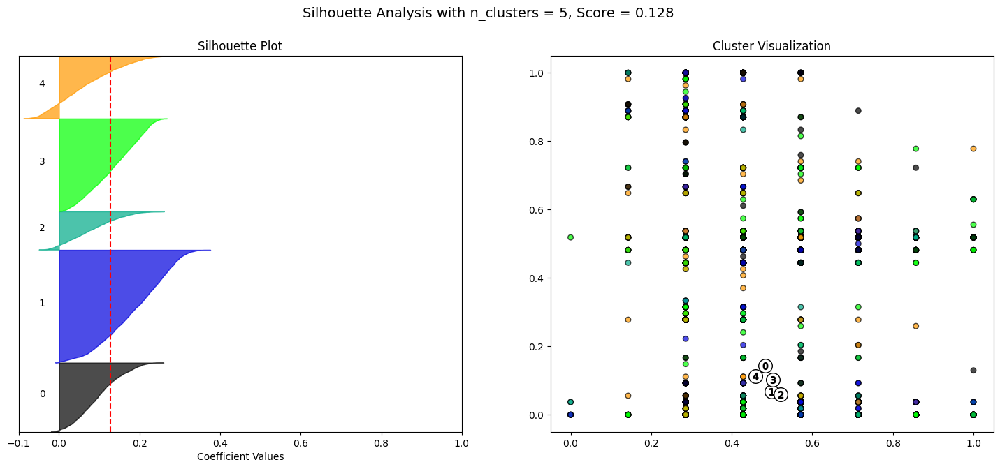

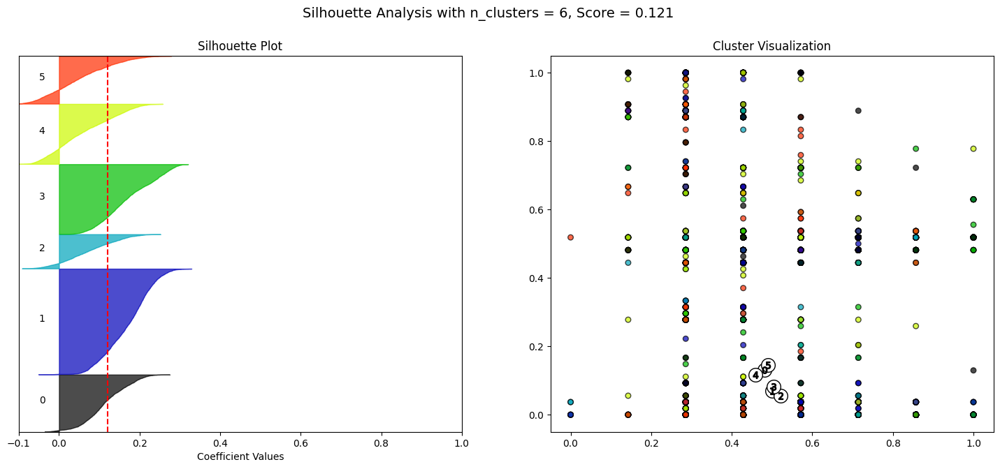

In [85]:
# Plot silhouette_score
import matplotlib.cm as cm
from sklearn.metrics import silhouette_score, silhouette_samples

for clusters in range(2, 7):
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(18, 7))

    ax1.set_xlim([-0.1, 1])
    ax1.set_ylim([0, len(x_train) + (clusters + 1) * 10])

    model = KMeans(n_clusters=clusters, random_state=10)
    labels = model.fit_predict(x_train)

    avg_silhouette = silhouette_score(x_train, labels)
    print(f"For n_clusters = {clusters}, Silhouette Score = {avg_silhouette:.3f}")

    sample_scores = silhouette_samples(x_train, labels)
    y_lower = 10

    for i in range(clusters):
        cluster_scores = np.sort(sample_scores[labels == i])
        size = cluster_scores.shape[0]
        y_upper = y_lower + size

        color = cm.nipy_spectral(float(i) / clusters)
        ax1.fill_betweenx(
            np.arange(y_lower, y_upper), 0, cluster_scores, facecolor=color, edgecolor=color, alpha=0.7
        )
        ax1.text(-0.05, y_lower + 0.5 * size, str(i))
        y_lower = y_upper + 10

    ax1.axvline(x=avg_silhouette, color="red", linestyle="--")
    ax1.set_title("Silhouette Plot")
    ax1.set_xlabel("Coefficient Values")
    ax1.set_yticks([])
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

    colors = cm.nipy_spectral(labels.astype(float) / clusters)
    ax2.scatter(x_train[:, 0], x_train[:, 1], s=30, c=colors, alpha=0.7, edgecolor="k")

    centers = model.cluster_centers_
    ax2.scatter(centers[:, 0], centers[:, 1], c="white", s=200, edgecolor="k")

    for i, center in enumerate(centers):
        ax2.scatter(center[0], center[1], marker=f"${i}$", s=50, edgecolor="k")

    ax2.set_title("Cluster Visualization")

    plt.suptitle(f"Silhouette Analysis with n_clusters = {clusters}, Score = {avg_silhouette:.3f} ", fontsize=14)

plt.show()

##### We may conclude that the number of clusters or K values is 2 -> given that silhouette score is closest to 1

<span style="color:brown; font-size:17px;">Hierarchical Cluster</span>

In [86]:
# Hierarchical cluster
from sklearn.cluster import AgglomerativeClustering

agg_clustering = AgglomerativeClustering(n_clusters=2)
y_pred = agg_clustering.fit_predict(x_train)

In [87]:
# Make a copy of the train data set for cluster description
agg_df = X_train.copy()
agg_df['cluster'] = y_pred 
# decribe the data Hierarchical cluster with respect to age and work experince 
agg_df.groupby(['cluster'])[['WorkExp', 'Age']].describe()

WorkExp                                                        Age  \
          count      mean       std  min  25%  50%       75%   max   count   
cluster                                                                      
0        8773.0  6.930720  4.832034  0.0  3.0  5.0  9.000000  20.0  8773.0   
1        7631.0  6.467795  4.751387  0.0  3.0  4.0  8.595861  20.0  7631.0   

                                                     
            mean       std  min  25%  50%  75%  max  
cluster                                              
0        2.41377  1.008628 -1.0  2.0  2.0  3.0  6.0  
1        2.47556  1.028888 -1.0  2.0  2.0  3.0  6.0

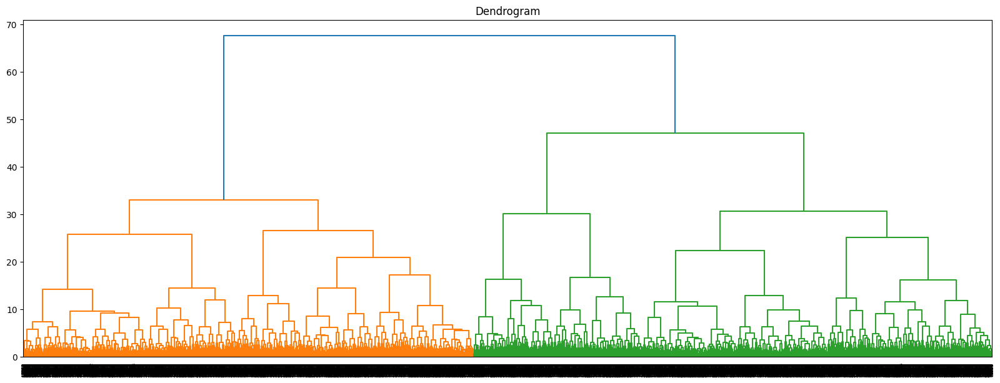

In [88]:
# Generate the linkage matrix
from scipy.cluster.hierarchy import dendrogram, linkage
linkage = linkage(x_train, method='ward')

dendrogram(linkage)
plt.title('Dendrogram')
plt.show()

### Classification Problem

<span style="color:brown; font-size:17px;">KNN</span>

In [89]:
# Computing the the optimal value of k or centroids and weight
from sklearn.neighbors import KNeighborsClassifier

def knn_model(weight = 'distance'):
    val_scores = []
    train_scores = []
    for k in range(1, 25):
        knn = KNeighborsClassifier(n_neighbors=k, weights=weight)
        knn = knn.fit(x_train, y_train)

        knn_pred = knn.predict(x_train)
        train_score = accuracy_score (y_train, knn_pred)
        train_scores.append(round(train_score, 3))

        knn_pred = knn.predict(x_test)
        val_score = accuracy_score (y_test , knn_pred)
        val_scores.append (round(val_score, 3))

    return train_scores, val_scores

knn_distance = knn_model(weight = 'distance')
knn_uniform = knn_model(weight = 'uniform')

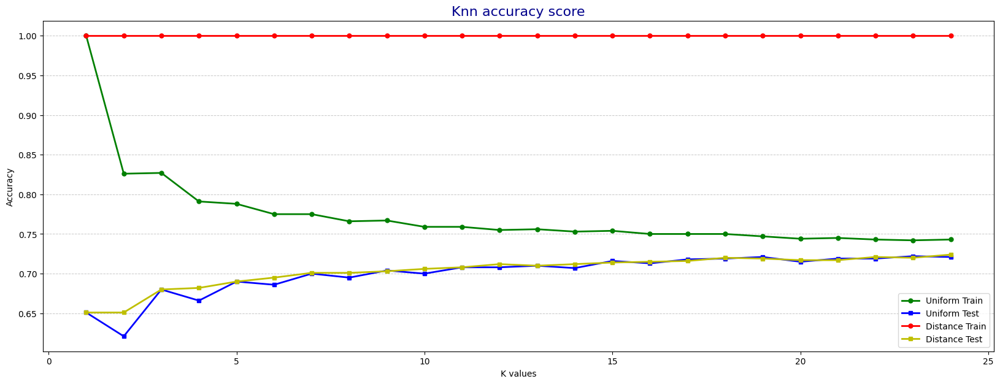

In [126]:
# Knn accuracy score distribution with weight = uniform and distance
plot_line_graph(range(1, 25),  knn_uniform[0], 'o-g', label='Uniform Train')
plot_line_graph(range(1, 25),  knn_uniform[1], 's-b', label='Uniform Test')

plot_line_graph(range(1, 25),  knn_distance[0], 'o-r', label='Distance Train')
plot_line_graph(range(1, 25),  knn_distance[1], 's-y', 'Knn accuracy score', 'K values', 'Accuracy', label='Distance Test')
plt.legend();

In [92]:
# Trying out grid search for K value
from sklearn.model_selection import GridSearchCV

knn_params = {
    'n_neighbors': range(1, 25),
    'weights': ['uniform', 'distance'],
    'metric': ['minkowski', 'euclidean', 'manhattan'],
    'p': [1, 2]
}

knn_search = GridSearchCV(KNeighborsClassifier(), knn_params, cv=4, n_jobs = -1)
knn_search.fit(x_train, y_train)

knn_search.best_params_

{'metric': 'minkowski', 'n_neighbors': 24, 'p': 1, 'weights': 'distance'}

<span style="color:brown; font-size:17px;">LogisticRegression classification</span>

In [93]:
# Grid sesrch using Logistic regression classifier
lgr_params = {
    'penalty': ['l1', 'l2', 'elasticnet'],
    'C': [0.01, 0.1, 1, 10],
    'solver': ['lbfgs', 'liblinear', 'sag', 'saga', 'newton-cg'],
    'max_iter': [100, 200, 300],
    'random_state': range(10, 30)
}

lgr_search = GridSearchCV(LogisticRegression(), lgr_params, cv = 4, n_jobs = -1)
lgr_search.fit(x_train, y_train)

lgr_search.best_params_

{'C': 0.1,
 'max_iter': 100,
 'penalty': 'l1',
 'random_state': 28,
 'solver': 'liblinear'}

<span style="color:brown; font-size:17px;">Decision Tree</span>

In [94]:
# Computing the optimal random_state value
from sklearn.tree import DecisionTreeClassifier

clf_val = []
clf_train = []

for st in range(1, 25):
    clf = DecisionTreeClassifier(random_state=st)

    clf = clf.fit(X=x_train, y=y_train)
    
    clf_pred = clf.predict(x_train)
    clf_score = accuracy_score(y_train, clf_pred)
    clf_train.append(clf_score)

    clf_pred = clf.predict(x_test)
    clf_score = accuracy_score(y_test, clf_pred)
    clf_val.append(clf_score)

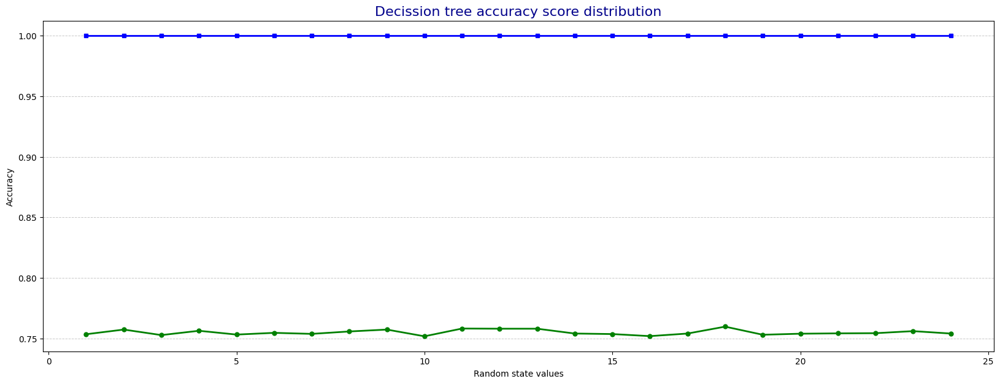

In [95]:
# Ploting accuracy score of test and train of decission tree 
plot_line_graph(range(1, 25),  clf_val, 'o-g')
plot_line_graph(range(1, 25),  clf_train, 's-b', 'Decission tree accuracy score distribution', 'Random state values', 'Accuracy')

In [96]:
# Lets get the max random state value
max_value = max(clf_val)
random_state = clf_val.index(max_value) + 1

random_state

18

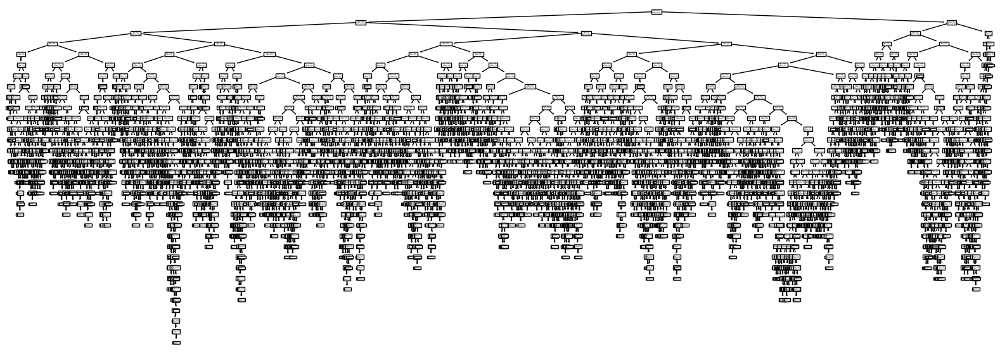

In [97]:
from sklearn import tree

clf = DecisionTreeClassifier(random_state=random_state)
clf = clf.fit(X=x_train, y=y_train)

tree.plot_tree(clf);

In [98]:
# Using grid search to compute find the hyperparameters
clf_params = {
    'criterion': ['gini', 'entropy', 'log_loss'],
    'max_depth': [3, 5, 10],
    'min_samples_split': [2, 5, 10]
}
clf = DecisionTreeClassifier(random_state = 5)

clf_search = GridSearchCV(clf, clf_params, cv=4, n_jobs=-1)
clf_search.fit(x_train, y_train)

clf_search.best_params_

{'criterion': 'entropy', 'max_depth': 10, 'min_samples_split': 2}

<span style="color:brown; font-size:17px;">SVM for classification</span>

In [99]:
# Computing the best hyperparameters for SVC
from sklearn.svm import SVC

svc_params = {
    'C': [0.1, 1, 10],
    'gamma': [0.001, 0.01, 0.1, 1],
    'kernel': ['linear', 'rbf', 'poly', 'sigmoid']
}

svc_search = GridSearchCV(SVC(), svc_params, cv=4, n_jobs=-1)
svc_search.fit(x_train, y_train)

svc_search.best_params_

{'C': 1, 'gamma': 1, 'kernel': 'rbf'}

<span style="color:brown; font-size:17px;">RandomForestClassifier</span>

In [100]:
# Computing the best hyperparameters for RandomForestClassifier
rfs_params = {
    'n_estimators': [50, 100, 200],     
    'max_depth': [None, 10, 20, 30],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4], 
    'max_features': ['sqrt', 'log2'],
    'bootstrap': [True, False]
}

rfs = RandomForestClassifier(random_state=47)

rfs_search = GridSearchCV(rfs, rfs_params, cv=4, n_jobs=-1)
rfs_search.fit(x_train, y_train)

rfs_search.best_params_

{'bootstrap': False,
 'max_depth': 20,
 'max_features': 'sqrt',
 'min_samples_leaf': 1,
 'min_samples_split': 5,
 'n_estimators': 200}

<span style="color:brown; font-size:17px;">XGBoost</span>

In [101]:
# !pip install xgboost
# Computing the best hyperparameters for XGBClassifier
from xgboost import XGBClassifier

xgboost_params = {
    'max_depth': [3, 6, 10],
    'learning_rate': [0.01, 0.1, 0.2],
    'n_estimators': [50, 100, 200]
}

xgboost_search = GridSearchCV(XGBClassifier(), xgboost_params, cv=4, n_jobs=-1)
xgboost_search.fit(x_train, y_train)

xgboost_search.best_params_

{'learning_rate': 0.2, 'max_depth': 3, 'n_estimators': 200}

### Classification problem data modeling

In [102]:
from sklearn.metrics import confusion_matrix, precision_score, recall_score,roc_auc_score

cls_models = {
    'LogisticRegression': LogisticRegression(**lgr_search.best_params_),
    'Decision Tree Classifier': DecisionTreeClassifier(random_state = 5, **clf_search.best_params_),
    'K-Nearest Neighbors': KNeighborsClassifier(**knn_search.best_params_),
    'SVC': SVC(**svc_search.best_params_),
    
    # Esemble learning models
    'Random Forest': RandomForestClassifier(random_state = 47, **rfs_search.best_params_),# **xgboost_search.best_params_ # increase in min_samples_split < accuracy 
    'XGBoost': XGBClassifier(**xgboost_search.best_params_) # learning_rate = 0.1, max_depth = 2, n_estimators = 400
}


train_results = []
test_results = []

for name, model in cls_models.items():
    model.fit(x_train, y_train)  

    train_pred = model.predict(x_train)
    test_pred = model.predict(x_test)
    
    confusion_train = confusion_matrix(y_train, train_pred)
    accuracy_train = round(accuracy_score(y_train, train_pred) * 100, 2)
    precision_train = round(precision_score(y_train, train_pred) * 100, 2)
    recall_train = round(recall_score(y_train, train_pred) * 100, 2)
    f1_train = round(f1_score(y_train, train_pred) * 100, 2)
    roc_train = round(roc_auc_score(y_train, train_pred) * 100, 2)

    confusion_test = confusion_matrix(y_test, test_pred)
    accuracy_test = round(accuracy_score(y_test, test_pred) * 100, 2)
    precision_test = round(precision_score(y_test, test_pred) * 100, 2)
    recall_test = round(recall_score(y_test, test_pred) * 100, 2)
    f1_test = round(f1_score(y_test, test_pred) * 100, 2)
    roc_test = round(roc_auc_score(y_test, test_pred) * 100, 2)

    train_results.append({
        'Model': name,
        'Confusion': confusion_train,
        'Accuracy Score': f"{accuracy_train}%",
        'Precision': f"{precision_train}%",
        'Recall': f"{recall_train}%",
        'F1 Score': f"{f1_train}%",
        'ROC-AUC': f"{roc_train}%",
        'Predictions': train_pred
    })

    test_results.append({
        'Model': name,
        'Confusion': confusion_test,
        'Accuracy Score': f"{accuracy_test}%",
        'Precision': f"{precision_test}%",
        'Recall': f"{recall_test}%",
        'F1 Score': f"{f1_test}%",
        'ROC-AUC': f"{roc_test}%",
        'Predictions': test_pred
    })

In [103]:
# Train dataset result table  
pd.DataFrame(train_results) 

,Model,Confusion,Accuracy Score,Precision,Recall,F1 Score,ROC-AUC,Predictions
0,LogisticRegression,"[[4243, 2603], [1916, 7642]]",72.45%,74.59%,79.95%,77.18%,70.97%,"[1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 0, 1, 0, 1, 0, ..."
1,Decision Tree Classifier,"[[5538, 1308], [1461, 8097]]",83.12%,86.09%,84.71%,85.4%,82.8%,"[1, 0, 0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 1, 1, 0, ..."
2,K-Nearest Neighbors,"[[6846, 0], [0, 9558]]",100.0%,100.0%,100.0%,100.0%,100.0%,"[1, 0, 0, 1, 1, 0, 1, 0, 1, 1, 0, 1, 0, 1, 0, ..."
3,SVC,"[[4204, 2642], [1289, 8269]]",76.04%,75.79%,86.51%,80.8%,73.96%,"[1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 0, 1, 0, 1, 0, ..."
4,Random Forest,"[[6823, 23], [13, 9545]]",99.78%,99.76%,99.86%,99.81%,99.76%,"[1, 0, 0, 1, 1, 0, 1, 0, 1, 1, 0, 1, 0, 1, 0, ..."
5,XGBoost,"[[5608, 1238], [1161, 8397]]",85.38%,87.15%,87.85%,87.5%,84.88%,"[1, 0, 0, 1, 1, 0, 0, 1, 1, 1, 0, 1, 1, 1, 0, ..."


In [104]:
# Test dataset result table  
pd.DataFrame(test_results) 

,Model,Confusion,Accuracy Score,Precision,Recall,F1 Score,ROC-AUC,Predictions
0,LogisticRegression,"[[1853, 1116], [819, 3243]]",72.48%,74.4%,79.84%,77.02%,71.12%,"[0, 1, 0, 0, 1, 1, 1, 0, 0, 1, 1, 1, 0, 1, 1, ..."
1,Decision Tree Classifier,"[[2230, 739], [722, 3340]]",79.22%,81.88%,82.23%,82.05%,78.67%,"[1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 1, 1, 0, 1, 1, ..."
2,K-Nearest Neighbors,"[[1792, 1177], [652, 3410]]",73.99%,74.34%,83.95%,78.85%,72.15%,"[1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, ..."
3,SVC,"[[1783, 1186], [587, 3475]]",74.78%,74.55%,85.55%,79.67%,72.8%,"[0, 1, 0, 0, 1, 1, 1, 0, 0, 1, 1, 1, 0, 1, 1, ..."
4,Random Forest,"[[2117, 852], [600, 3462]]",79.35%,80.25%,85.23%,82.66%,78.27%,"[1, 1, 0, 0, 1, 1, 0, 1, 0, 1, 1, 1, 0, 1, 1, ..."
5,XGBoost,"[[2376, 593], [564, 3498]]",83.54%,85.5%,86.12%,85.81%,83.07%,"[1, 1, 0, 0, 1, 1, 0, 0, 0, 1, 1, 1, 0, 1, 1, ..."


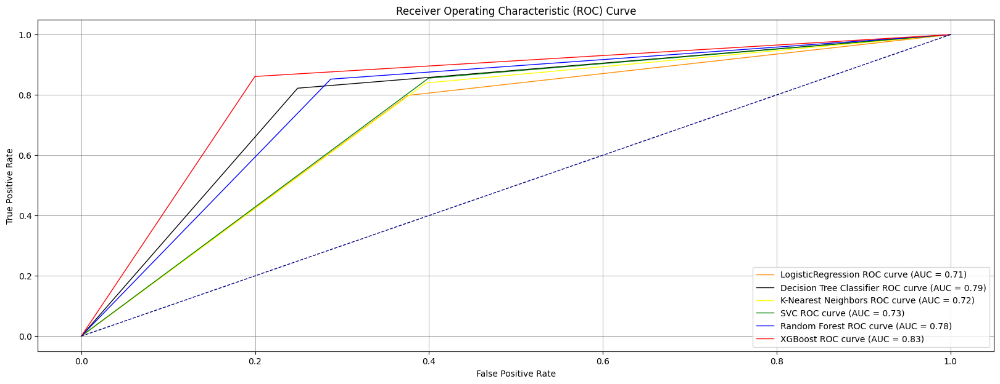

In [165]:
# Ploting Roc Curve for the all four models and esemble models
from sklearn.metrics import roc_curve, auc
colors = ['darkorange', 'black', 'yellow', 'green', 'blue', 'red']

for i, result in enumerate(test_results):
    fpr, tpr, thresholds = roc_curve(y_test, result['Predictions'])
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, color=colors[i], lw=1, label=f'{result["Model"]} ROC curve (AUC = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='navy', lw=1, linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.grid(which='major', color='grey', linestyle='-', linewidth=0.5)
plt.legend(loc='lower right');


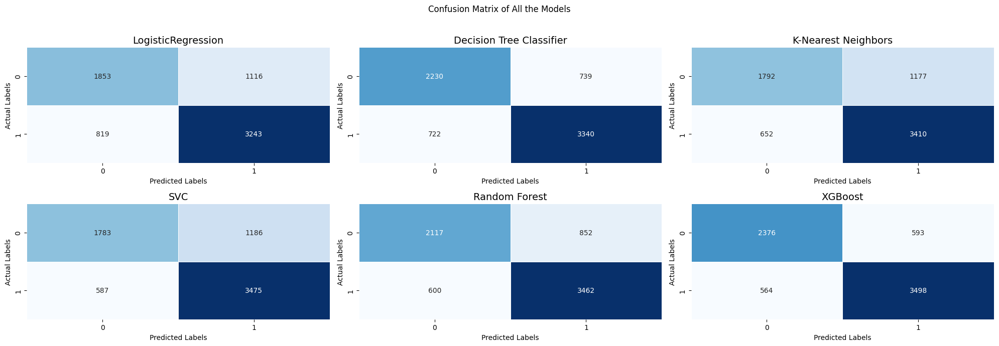

In [168]:
# Plutting the confusion metrix of all models
fig, axes = plt.subplots(2, 3)
ax1, ax2, ax3, ax4, ax5, ax6 = axes.flatten()
axes_list = [ax1, ax2, ax3, ax4, ax5, ax6]

fig.suptitle('Confusion Matrix of All the Models')

for i, result in enumerate(test_results):
    sns.heatmap(result['Confusion'], annot=True, fmt='d', cmap='Blues', linewidths=.5, cbar=False, ax=axes_list[i])
    axes_list[i].set_xlabel('Predicted Labels')
    axes_list[i].set_ylabel('Actual Labels')  
    axes_list[i].set_title(result['Model'], fontsize=14)     

plt.tight_layout(rect=[0, 0, 1, 0.96])

### Regression Problem -> Linear regrtession

In [107]:
# Prepare our data for modeling
x1_train, x1_test, y1_train, y1_test = preprocess_data(x=xFeature, y=yTarget_reg)

<span style="color:brown; font-size:17px;">TheilSenRegressor</span>

In [108]:
# Computing the best hyperparameters for TheilSenRegressor
from sklearn.linear_model import TheilSenRegressor
theil_params = {
    'fit_intercept': [True, False],
    'max_subpopulation': [None, 50, 100],
    'n_subsamples': [None, 200, 500],
}

theil_search = GridSearchCV(TheilSenRegressor(), theil_params, cv=4, scoring='neg_mean_squared_error', n_jobs=-1)
theil_search.fit(X_train, y_train)

theil_search.best_params_

{'fit_intercept': True, 'max_subpopulation': 100, 'n_subsamples': 500}

<span style="color:brown; font-size:17px;">SVR</span>

In [109]:
# Computing the best hyperparameters for SVR
from sklearn.svm import SVR

svr_params = {
    'kernel': ['linear', 'rbf', 'poly'],
    'C': [0.1, 1, 10, 100],
    'epsilon': [0.1, 0.5, 1],
    'gamma': ['scale', 'auto']
}

svr_search = GridSearchCV(SVR(), param_grid=svr_params, scoring='neg_mean_squared_error', cv=5, n_jobs=-1)
svr_search.fit(x1_train, y1_train)

svr_search.best_params_

{'C': 100, 'epsilon': 0.1, 'gamma': 'scale', 'kernel': 'poly'}

<span style="color:brown; font-size:17px;">DecisionTreeRegressor</span>

In [110]:
# Computing the best hyperparameters for DecisionTreeRegressor
from sklearn.tree import DecisionTreeRegressor

dtr_params = {
    'max_depth': [None, 10, 20, 30],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'criterion': ['squared_error', 'friedman_mse', 'absolute_error']
}

dtr = DecisionTreeRegressor(random_state=42)
dtr_search = GridSearchCV(dtr, dtr_params, cv=4, scoring='neg_mean_squared_error', n_jobs=-1)
dtr_search.fit(x1_train, y1_train)

dtr_search.best_params_

{'criterion': 'absolute_error',
 'max_depth': 10,
 'min_samples_leaf': 4,
 'min_samples_split': 10}

<span style="color:brown; font-size:17px;">RandomForestRegressor</span>

In [111]:
# # Computing the best hyperparameters for RandomForestRegressor
# from sklearn.ensemble import RandomForestRegressor

# df_params = {
#     'n_estimators': [100, 200, 300],
#     'max_depth': [None, 10, 20, 30],
#     'min_samples_split': [2, 5, 10],
#     'min_samples_leaf': [1, 2, 4]
# }

# rf = RandomForestRegressor(random_state=42)
# rf_search = GridSearchCV(rf, df_params,  cv=4, scoring='neg_mean_squared_error', n_jobs=-1)
# rf_search.fit(x1_train, y1_train)

# rf_search.best_params_

{'max_depth': 30,
 'min_samples_leaf': 4,
 'min_samples_split': 10,
 'n_estimators': 300}

<span style="color:brown; font-size:17px;">XGBRegressor</span>

In [ ]:
# # Computing the best hyperparameters for XGBRegressor
# from xgboost import XGBRegressor

# xg_params = {
#     'n_estimators': [100, 200, 300, 400],
#     'max_depth': [3, 5, 7, 10],
#     'learning_rate': [0.01, 0.1, 0.2],
# }

# xg_search = GridSearchCV(XGBRegressor(), xg_params, cv=4, scoring='neg_mean_squared_error', n_jobs=-1)
# xg_search.fit(x1_train, y1_train)

# xg_search.best_params_

{'learning_rate': 0.2, 'max_depth': 3, 'n_estimators': 400}

<span style="color:brown; font-size:17px;">GradientBoostingRegressor</span>

In [113]:
## Computing the best hyperparameters for GradientBoostingRegressor
# from sklearn.ensemble import GradientBoostingRegressor

# gbr_params = {
#     'n_estimators': [100, 200, 300],
#     'learning_rate': [0.01, 0.05, 0.1, 0.2],
#     'max_depth': [3, 4, 5],
#     'min_samples_split': [2, 5, 10],
#     'min_samples_leaf': [1, 5, 10],
#     'subsample': [0.7, 0.85, 1.0]
# }

# gbr = GradientBoostingRegressor(random_state=42)

# gbr_search = GridSearchCV(gbr, gbr_params, scoring='neg_mean_squared_error', cv=5, n_jobs=-1)
# gbr_search.fit(x1_train, y1_train)

# gbr_search.best_params_

{'learning_rate': 0.2,
 'max_depth': 3,
 'min_samples_leaf': 5,
 'min_samples_split': 2,
 'n_estimators': 300,
 'subsample': 1.0}

In [135]:
from sklearn.metrics import r2_score, mean_squared_error, root_mean_squared_error, mean_absolute_error, mean_absolute_percentage_error

reg_models = {
    'SVR': SVR(**svr_search.best_params_),
    'Decision Tree Regressor': DecisionTreeRegressor(random_state = 42, **dtr_search.best_params_),
    'TheilSen Regressor': TheilSenRegressor(**theil_search.best_params_),
    
    # ensemble learning algorithms
    # 'Random Forest Regressor': RandomForestRegressor(**rf_search.best_params_),
    # 'XGB Regressor': XGBRegressor(**xg_search.best_params_),
    # 'Gradient Boosting Regressor': GradientBoostingRegressor(**gbr_search.best_params_)
}


train_results2 = []
test_results2 = []

for name, model in reg_models.items():
    model.fit(x1_train, y1_train)  

    train_pred = model.predict(x1_train)
    test_pred = model.predict(x1_test)
    
    mae_train = round(mean_absolute_error(y1_train, train_pred), 2)
    mse_train = round(mean_squared_error(y1_train, train_pred), 2)
    rmse_train = round(root_mean_squared_error(y1_train, train_pred), 2)
    r2_train = round(r2_score(y1_train, train_pred), 2)
    mape_train = round(mean_absolute_percentage_error(y1_train, train_pred), 2)

    mae_test = round(mean_absolute_error(y1_test, test_pred), 2)
    mse_test = round(mean_squared_error(y1_test, test_pred), 2)
    rmse_test = round(root_mean_squared_error(y1_test, test_pred), 2)
    r2_test = round(r2_score(y1_test, test_pred), 2)
    mape_test = round(mean_absolute_percentage_error(y1_test, test_pred), 2)

    train_results2.append({
        'Model': name,
        'MAE': int(mae_train),
        'MSE': mse_train,
        'RMSE': rmse_train,
        'R-squared': r2_train,
        'MAPE': f'{mape_train}%',
        'Predictions': train_pred
    })

    test_results2.append({
        'Model': name,
        'MAE': int(mae_test),
        'MSE': mse_test,
        'RMSE': rmse_test,
        'R-squared': r2_test,
        'MAPE': f'{mape_test}%',
        'Predictions': test_pred
    })


In [169]:
# Train dataset result table  
pd.DataFrame(train_results2)

,Model,MAE,MSE,RMSE,R-squared,MAPE,Predictions
0,SVR,33968,2.064388e+09,45435.53,0.29,85.05%,"[69984.96766318844, 73244.89284931566, 42605.0..."
1,Decision Tree Regressor,24549,1.264033e+09,35553.25,0.57,56.92%,"[102907.0, 42892.0, 18302.5, 125000.0, 152865...."
2,TheilSen Regressor,35297,2.107211e+09,45904.37,0.28,93.0%,"[76633.4275221134, 89193.3788966933, 55982.668..."


In [170]:
# Test dataset result table  
pd.DataFrame(test_results2)

,Model,MAE,MSE,RMSE,R-squared,MAPE,Predictions
0,SVR,34047,2.008986e+09,44821.72,0.31,61.14%,"[42335.553639805905, 63399.24878619681, 14658...."
1,Decision Tree Regressor,27735,1.476835e+09,38429.61,0.49,47.48%,"[61505.5, 45111.0, 898.0, 18302.5, 150000.0, 1..."
2,TheilSen Regressor,35376,2.057421e+09,45358.81,0.29,66.66%,"[47720.60505115903, 69983.08491038601, 13721.1..."


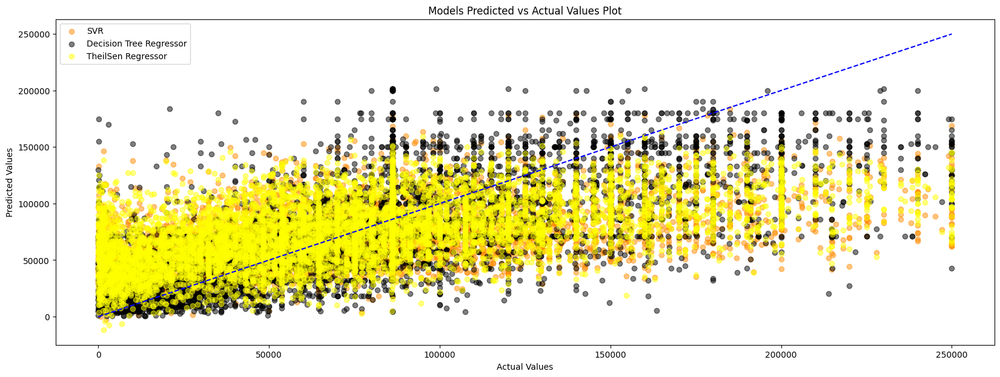

In [164]:
# Models prediction vs Actual values plot
for i, result in enumerate(test_results2):
    plt.scatter(y1_test, result['Predictions'], color=colors[i], alpha=0.5,label=f'{result["Model"]}')
    
plt.plot([min(y1_test), max(y1_test)], [min(y1_test), max(y1_test)], color='blue', linestyle='--') 
plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')
plt.title('Models Predicted vs Actual Values Plot')
plt.legend();

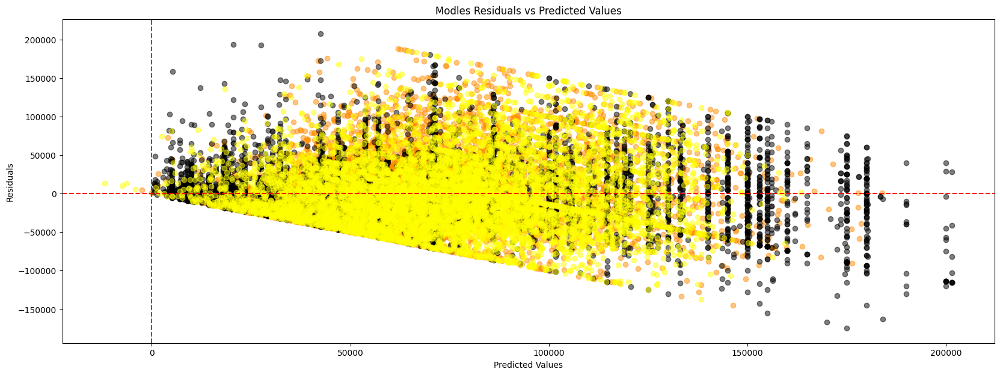

In [163]:
# Plot the residuals of the difference between actual values and predicted values
for i, result in enumerate(test_results2):
    diff = y1_test - result['Predictions']
    plt.scatter(result['Predictions'], diff, color=colors[i], alpha=0.5, label=f'{result["Model"]}')
plt.axhline(y=0, color='red', linestyle='--') 
plt.axvline(x=0, color='red', linestyle='--') 
plt.xlabel('Predicted Values')
plt.ylabel('Residuals')
plt.title('Modles Residuals vs Predicted Values Plot');